In [1]:
import pandas as pd
import os
import glob
import math
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
import cartopy.feature as cfeature
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
from matplotlib.ticker import MultipleLocator
import re
from scipy.interpolate import griddata
import pyproj
from tqdm import tqdm
import rasterio
from scipy.fftpack import fft2, ifft2, fftshift
from scipy.interpolate import RegularGridInterpolator
from matplotlib.patches import Rectangle

In [2]:
# Define the actual path to the airborne gravity file

gravity_file_path = r"C:\Users\SREEKANTH\Documents\Geoid_Modelling_V5\DATA\COLORADO\GRAVD\NGS_GRAVD_Block_MS05_Gravity_Data_BETA2.txt"

# Load the file, reading only the required columns (lat, long, altitude, gravity)
# latitude and longitude are in decimal degrees ( GPS co-ordinates of flight)
# Altitude is flight height from GPS in meters (basically its ellipsoidal height of flight)
# gravity is full field gravity at flight altitude in milligals with preprocessing done 
gravity_data = pd.read_csv(
    gravity_file_path, 
    delim_whitespace=True, 
    usecols=[2, 3, 4, 5], 
    names=['Latitude(DD)', 'Longitude(DD)', 'Altitude(m)', 'Gravity(mGal)'], 
    header=None
)
# Add an 'identifier' column with index values
gravity_data['identifier'] = gravity_data.index
# Reorder columns to make 'identifier' the first column
gravity_data = gravity_data[['identifier', 'Latitude(DD)', 'Longitude(DD)', 'Altitude(m)', 'Gravity(mGal)']]

In [3]:
# Downsample the gravity data by taking every 10th point
sampled_gravity_data = gravity_data.iloc[::10].reset_index(drop=True)

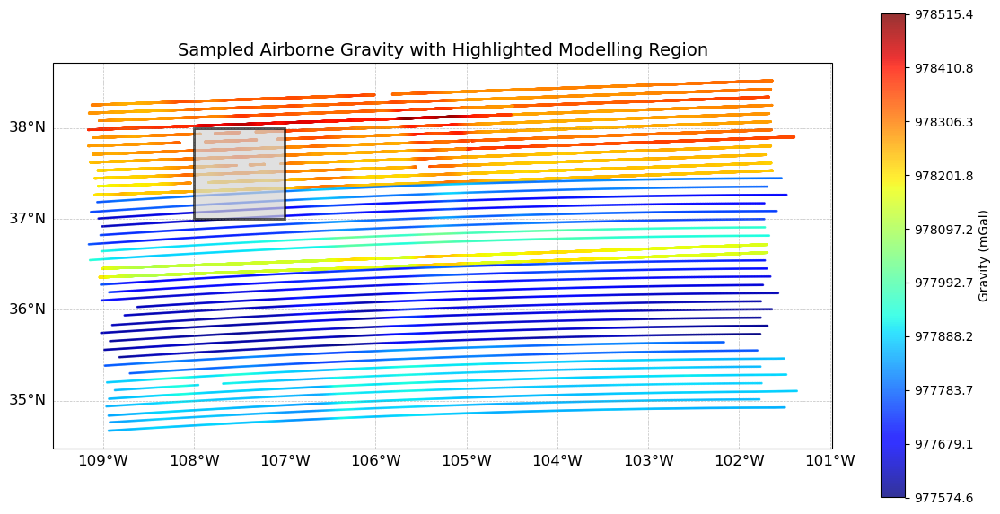

In [4]:

# Get min and max of Gravity and define ticks
vmin = sampled_gravity_data['Gravity(mGal)'].min()
vmax = sampled_gravity_data['Gravity(mGal)'].max()
ticks = np.linspace(vmin, vmax, 10)

# Create figure and map
fig = plt.figure(figsize=(14, 10))
ax = plt.axes(projection=ccrs.PlateCarree())

# Scatter plot with normalized color scale
sc = ax.scatter(
    sampled_gravity_data['Longitude(DD)'], 
    sampled_gravity_data['Latitude(DD)'], 
    c=sampled_gravity_data['Gravity(mGal)'], 
    cmap='jet',
    s=1,
    alpha=0.8,
    vmin=vmin,
    vmax=vmax,
    transform=ccrs.PlateCarree()
)

# Add gridlines with 1-degree interval
gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 12}
gl.ylabel_style = {'size': 12}
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER
gl.xlocator = MultipleLocator(1)
gl.ylocator = MultipleLocator(1)

# Highlight grid bounded by 37–38°N and 108–107°W
highlight_rect = Rectangle(
    xy=(-108, 37),         # lower-left corner
    width=1,               # 1 degree wide
    height=1,              # 1 degree tall
    edgecolor='black',
    facecolor='lightgrey',
    linewidth=2,
    alpha=0.7,
    transform=ccrs.PlateCarree()
)
ax.add_patch(highlight_rect)

# Title and colorbar with defined ticks
plt.title('Sampled Airborne Gravity with Highlighted Modelling Region', fontsize=14)
cbar = plt.colorbar(sc, ax=ax, orientation='vertical', label='Gravity (mGal)', shrink=0.7, ticks=ticks)
plt.savefig('sampled_airborne_gravity.png', dpi=300, bbox_inches='tight')
plt.show()


In [5]:
import pandas as pd
from scipy.stats import skew, kurtosis

# Extract gravity values
gravity = sampled_gravity_data['Gravity(mGal)']

# Compute descriptive statistics
mean_val = gravity.mean()
median_val = gravity.median()
std_dev = gravity.std()
min_val = gravity.min()
max_val = gravity.max()
range_val = max_val - min_val
skewness_val = skew(gravity, nan_policy='omit')
kurtosis_val = kurtosis(gravity, nan_policy='omit')

# Print the results
print("Descriptive Statistics for Gravity (mGal):")
print(f"Mean       : {mean_val:.4f}")
print(f"Median     : {median_val:.4f}")
print(f"Std Dev    : {std_dev:.4f}")
print(f"Min        : {min_val:.4f}")
print(f"Max        : {max_val:.4f}")
print(f"Range      : {range_val:.4f}")
print(f"Skewness   : {skewness_val:.4f}")
print(f"Kurtosis   : {kurtosis_val:.4f}")


Descriptive Statistics for Gravity (mGal):
Mean       : 978247.7851
Median     : 978270.0600
Std Dev    : 138.3839
Min        : 977574.6100
Max        : 978515.3600
Range      : 940.7500
Skewness   : -2.5896
Kurtosis   : 8.0676


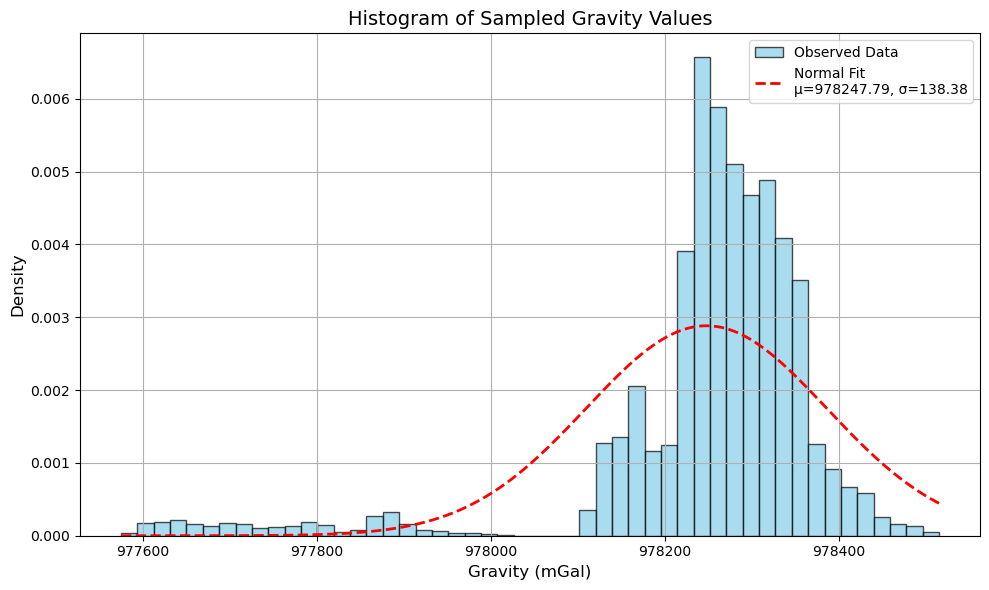

In [6]:
import matplotlib.pyplot as plt
import numpy as np
from scipy.stats import norm

# Extract gravity values
gravity = sampled_gravity_data['Gravity(mGal)'].dropna()

# Compute statistics for normal distribution fit
mu = gravity.mean()
sigma = gravity.std()

# Plot histogram
plt.figure(figsize=(10, 6))
n, bins, patches = plt.hist(gravity, bins=50, color='skyblue', alpha=0.7, edgecolor='black', density=True, label='Observed Data')

# Plot normal distribution curve
x = np.linspace(gravity.min(), gravity.max(), 1000)
plt.plot(x, norm.pdf(x, mu, sigma), 'r--', linewidth=2, label=f'Normal Fit\nμ={mu:.2f}, σ={sigma:.2f}')

# Labels and title
plt.title('Histogram of Sampled Gravity Values', fontsize=14)
plt.xlabel('Gravity (mGal)', fontsize=12)
plt.ylabel('Density', fontsize=12)
plt.legend()
plt.grid(True)

# Show plot
plt.tight_layout()
plt.savefig('Histogram_Sampled_Gravity.png', dpi=300, bbox_inches='tight')
plt.show()


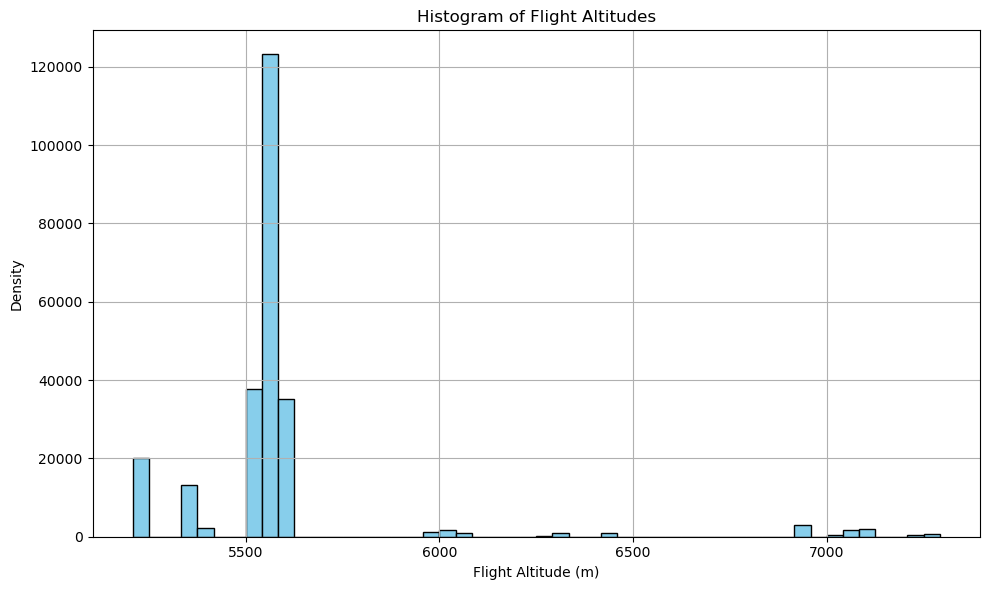

In [7]:
import matplotlib.pyplot as plt

# Plot histogram of flight altitudes
plt.figure(figsize=(10, 6))
plt.hist(sampled_gravity_data['Altitude(m)'], bins=50, color='skyblue', edgecolor='black', density=False)
plt.xlabel('Flight Altitude (m)')
plt.ylabel('Density')
plt.title('Histogram of Flight Altitudes')
plt.grid(True)
plt.tight_layout()
plt.savefig('Histogram_flight_altidude.png', dpi=300, bbox_inches='tight')
plt.show()


In [8]:
from scipy.stats import pearsonr

r, p = pearsonr(sampled_gravity_data['Altitude(m)'], sampled_gravity_data['Gravity(mGal)'])
print(f"Pearson correlation coefficient: r = {r:.4f}, p-value = {p:.4e}")


Pearson correlation coefficient: r = -0.8920, p-value = 0.0000e+00


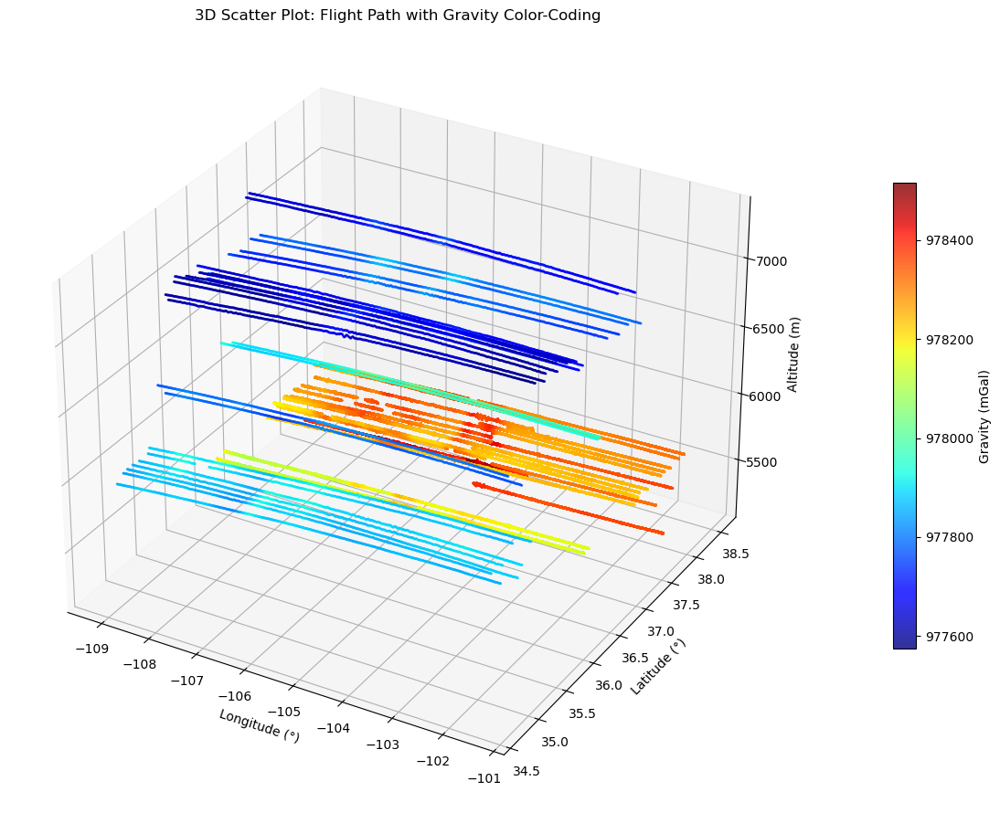

In [9]:
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt

fig = plt.figure(figsize=(12, 9))
ax = fig.add_subplot(111, projection='3d')

# 3D scatter plot
sc = ax.scatter(
    sampled_gravity_data['Longitude(DD)'],
    sampled_gravity_data['Latitude(DD)'],
    sampled_gravity_data['Altitude(m)'],
    c=sampled_gravity_data['Gravity(mGal)'],
    cmap='jet',
    s=1,
    alpha=0.8
)

ax.set_xlabel('Longitude (°)')
ax.set_ylabel('Latitude (°)')
ax.set_zlabel('Altitude (m)')
ax.set_title('3D Scatter Plot: Flight Path with Gravity Color-Coding')

# Colorbar
cbar = plt.colorbar(sc, ax=ax, shrink=0.6, pad=0.1)
cbar.set_label('Gravity (mGal)')

plt.tight_layout()
plt.savefig('flight_path.png', dpi=300, bbox_inches='tight')
plt.show()


In [11]:
# download GGM values and save files to output folder - icgem_output_Chunks
# name each file as GGM05G_Part01 to GGMO5G_Partxx (ensure each part is named in 2 digits)

# Define the path to the folder containing .dat files
folder_path = r"C:\Users\SREEKANTH\Documents\Geoid_Modelling_V5\DATA\COLORADO\ICGEM_OUTPUTS"

# Get a sorted list of .dat files in the specified folder
file_list = sorted([f for f in os.listdir(folder_path) if f.startswith("GGM05G_Part") and f.endswith('.dat')])

# Initialize an empty list to store DataFrames
dataframes = []

# Iterate over the sorted file list to maintain order
for filename in file_list:
    file_path = os.path.join(folder_path, filename)

    # Open the file and read until reaching a line containing 'end_of_head'
    with open(file_path, 'r') as file:
        # Skip lines until finding the 'end_of_head' line
        for line in file:
            if 'end_of_head' in line:
                break

        # Load the remaining lines into a DataFrame
        df = pd.read_csv(file, delim_whitespace=True, header=None)

        # Assign column names based on the provided description
        df.columns = [
            "identifier", "longitude", "latitude", "h_over_ell",
            "geoid", "gravity_anomaly"
        ]

        # Append the DataFrame to the list
        dataframes.append(df)

# Concatenate all DataFrames into a single DataFrame
icgem_df = pd.concat(dataframes, ignore_index=True)

In [12]:
calculation_df = sampled_gravity_data.copy()
# Add the 'Geoid_GGM(Meters)' and 'Gravity_Anomaly_GGM(mGals)' columns to calculation_df
calculation_df['Geoid_GGM(m)'] = icgem_df['geoid']
calculation_df['Gravity_Anomaly_GGM(mGal)'] = icgem_df['gravity_anomaly']

In [13]:
calculation_df

,identifier,Latitude(DD),Longitude(DD),Altitude(m),Gravity(mGal),Geoid_GGM(m),Gravity_Anomaly_GGM(mGal)
0,0,38.203030,-105.652233,5376.489,978434.33,-15.219408,36.043101
1,10,38.203048,-105.651744,5376.236,978434.06,-15.220012,36.044109
2,20,38.203065,-105.651255,5376.004,978433.79,-15.220616,36.045103
3,30,38.203081,-105.650767,5375.790,978433.52,-15.221221,36.046083
4,40,38.203098,-105.650278,5375.571,978433.24,-15.221826,36.047052
...,...,...,...,...,...,...,...
246057,2460570,37.173810,-101.788759,7208.433,977680.87,-25.341379,-13.991472
246058,2460580,37.173873,-101.772366,7208.429,977681.53,-25.378160,-14.251395
246059,2460590,37.173926,-101.755994,7205.631,977681.93,-25.414394,-14.502000
246060,2460600,37.173991,-101.739672,7205.213,977681.81,-25.449986,-14.741518


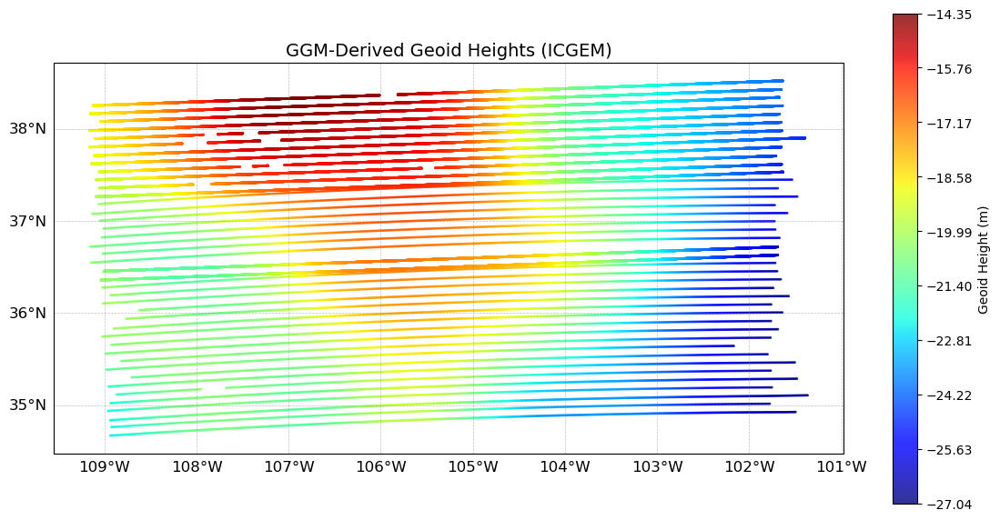

In [14]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from matplotlib.ticker import MultipleLocator
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER

# Get min, max, and ticks for geoid
vmin = calculation_df['Geoid_GGM(m)'].min()
vmax = calculation_df['Geoid_GGM(m)'].max()
ticks = np.linspace(vmin, vmax, 10)

# Create figure and map
fig = plt.figure(figsize=(14, 10))
ax = plt.axes(projection=ccrs.PlateCarree())

# Scatter plot
sc = ax.scatter(
    calculation_df['Longitude(DD)'],
    calculation_df['Latitude(DD)'],
    c=calculation_df['Geoid_GGM(m)'],
    cmap='jet',
    s=1,
    alpha=0.8,
    vmin=vmin,
    vmax=vmax,
    transform=ccrs.PlateCarree()
)

# Gridlines
gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 12}
gl.ylabel_style = {'size': 12}
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER
gl.xlocator = MultipleLocator(1)
gl.ylocator = MultipleLocator(1)

# Title and colorbar
plt.title('GGM-Derived Geoid Heights (ICGEM)', fontsize=14)
cbar = plt.colorbar(sc, ax=ax, orientation='vertical', label='Geoid Height (m)', shrink=0.7, ticks=ticks)
plt.savefig('ggm_geoid.png', dpi=300, bbox_inches='tight')
plt.show()


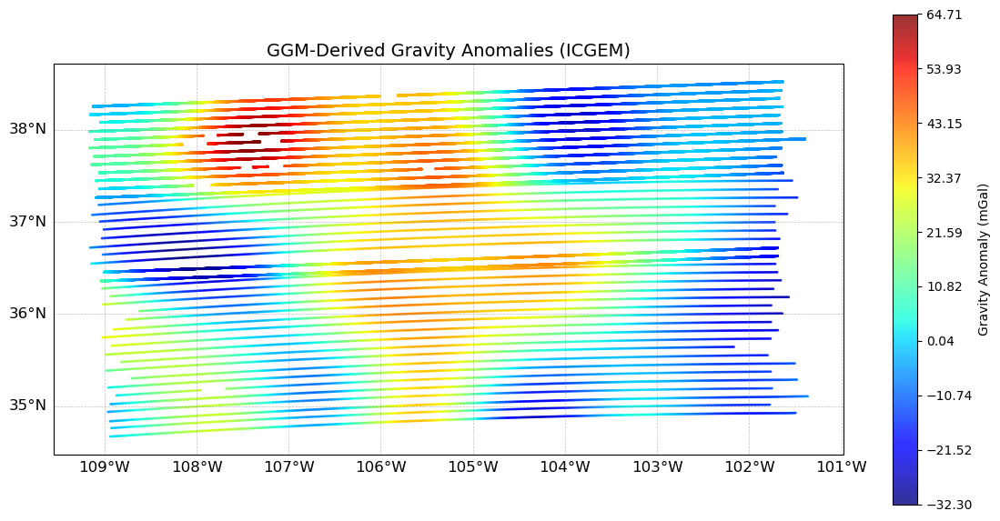

In [15]:
# Get min, max, and ticks for gravity anomaly
vmin = calculation_df['Gravity_Anomaly_GGM(mGal)'].min()
vmax = calculation_df['Gravity_Anomaly_GGM(mGal)'].max()
ticks = np.linspace(vmin, vmax, 10)

# Create figure and map
fig = plt.figure(figsize=(14, 10))
ax = plt.axes(projection=ccrs.PlateCarree())

# Scatter plot
sc = ax.scatter(
    calculation_df['Longitude(DD)'],
    calculation_df['Latitude(DD)'],
    c=calculation_df['Gravity_Anomaly_GGM(mGal)'],
    cmap='jet',
    s=1,
    alpha=0.8,
    vmin=vmin,
    vmax=vmax,
    transform=ccrs.PlateCarree()
)

# Gridlines
gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 12}
gl.ylabel_style = {'size': 12}
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER
gl.xlocator = MultipleLocator(1)
gl.ylocator = MultipleLocator(1)

# Title and colorbar
plt.title('GGM-Derived Gravity Anomalies (ICGEM)', fontsize=14)
cbar = plt.colorbar(sc, ax=ax, orientation='vertical', label='Gravity Anomaly (mGal)', shrink=0.7, ticks=ticks)
plt.savefig('ggm_anomaly.png', dpi=300, bbox_inches='tight')
plt.show()


In [17]:
def perform_point_wise_calculations(calculation_df):
    """
    Perform point-wise gravity-related calculations on a given DataFrame.

    This function computes a series of gravity-related quantities for each point
    in the input DataFrame based on ellipsoidal constants of the WGS 84 reference system.
    
    Calculations include:
        - Normal gravity based on Somigliana's formula
        - Approximate orthometric height (H ≈ h - N)
        - Second-order free-air correction
        - Free Air Anomaly (FAA)
        - Long wavelength correction using GGM gravity anomaly
        - Atmospheric correction for gravitational attraction
        - Final surface gravity anomaly corrected for atmospheric effects

    Parameters
    ----------
    calculation_df : pandas.DataFrame
        Input DataFrame must contain the following columns:
        - 'Latitude(DD)'         : Latitude in decimal degrees
        - 'Altitude(m)'          : Ellipsoidal height in meters
        - 'Geoid_GGM(m)'         : Geoid undulation from GGM in meters
        - 'Gravity(mGal)'        : Observed gravity in mGal
        - 'Gravity_Anomaly_GGM(mGal)' : Gravity anomaly from GGM in mGal

    Returns
    -------
    calculation_df : pandas.DataFrame
        Updated DataFrame with the following additional columns:
        - 'g_normal(mGal)'                   : Normal gravity
        - 'H_approx(m)'                      : Approximate orthometric height
        - 'Free_Air_Correction(mGal)'        : 2nd-order free air correction
        - 'FAA(mGal)'                        : Free Air Anomaly
        - 'gravity_anomaly_s_mw(mGal)'       : Short and medium wavelength gravity anomaly
        - 'delta_atm(mGal)'                  : Atmospheric correction
        - 'gravity_anomaly_s_mw_atm(mGal)'   : gravity anomaly after all corrections upto terrain correction
    """
    # Ellipsoidal Constants (WGS 84)
    omega = 7.292115e-5        # Angular velocity of Earth (rad/s)
    a = 6378137.0              # Semi-major axis (meters)
    b = 6356752.3142           # Semi-minor axis (meters)
    GM = 3986004.418e8         # Geocentric gravitational constant (m^3/s^2)
    f = 1 / 298.257223563      # Flattening
    gamma_eq = 978032.53359    # Normal gravity at equator (mGal)
    gamma_pole = 983218.49378  # Normal gravity at pole (mGal)

    # Normal gravity calculation (Somigliana's formula)
    lat_rad = np.radians(calculation_df['Latitude(DD)'])
    cos_lat = np.cos(lat_rad)
    sin_lat = np.sin(lat_rad)

    numerator = (a * gamma_eq * cos_lat**2) + (b * gamma_pole * sin_lat**2)
    denominator = np.sqrt((a**2 * cos_lat**2) + (b**2 * sin_lat**2))
    calculation_df['g_normal(mGal)'] = numerator / denominator

    # Approximate orthometric height, H = h - N
    calculation_df['H_approx(m)'] = calculation_df['Altitude(m)'] - calculation_df['Geoid_GGM(m)']

    # 2nd order free air correction
    m = (omega**2 * a**2 * b) / GM
    c1 = (-2 * calculation_df['g_normal(mGal)']) / a
    term1 = (1 + f + m - 2 * f * sin_lat**2) * calculation_df['H_approx(m)']
    c2 = 3 * (calculation_df['g_normal(mGal)'] / (a**2))
    term2 = calculation_df['H_approx(m)']**2
    fac = (c1 * term1) + (c2 * term2)
    calculation_df['Free_Air_Correction(mGal)'] = -fac

    # Free Air Anomaly (FAA)
    calculation_df['FAA(mGal)'] = (
        calculation_df['Gravity(mGal)'] 
        + calculation_df['Free_Air_Correction(mGal)'] 
        - calculation_df['g_normal(mGal)']
    )

    # Remove long wavelength effects
    calculation_df['gravity_anomaly_s_mw(mGal)'] = (
        calculation_df['FAA(mGal)'] - calculation_df['Gravity_Anomaly_GGM(mGal)']
    )

    # Atmospheric correction
    H = calculation_df['H_approx(m)']
    calculation_df['delta_atm(mGal)'] = (
        0.871 
        - 1.0298e-4 * H 
        + 5.3105e-9 * H**2
        - 2.1642e-13 * H**3
        + 9.5246e-18 * H**4
        - 2.2411e-22 * H**5
    )

    calculation_df['gravity_anomaly_s_mw_atm(mGal)'] = (
        calculation_df['gravity_anomaly_s_mw(mGal)'] - calculation_df['delta_atm(mGal)']
    )

    return calculation_df


In [18]:
calculation_df = perform_point_wise_calculations(calculation_df)

In [19]:
def plot_dataframe_column_map(df, value_col, 
                              lat_col='Latitude(DD)', lon_col='Longitude(DD)', 
                              title=None, colorbar_label=None,
                              cmap='jet', point_size=10, alpha=0.8, 
                              dpi=300):
    """
    Plots any numeric value from a DataFrame over geographic coordinates and
    automatically saves the figure with a timestamped filename.

    Parameters:
    - df: pandas DataFrame containing data
    - value_col: str, name of the column to plot
    - lat_col: str, name of the latitude column (default: 'Latitude(DD)')
    - lon_col: str, name of the longitude column (default: 'Longitude(DD)')
    - title: str, title of the plot (optional)
    - colorbar_label: str, label for the colorbar (optional; defaults to value_col)
    - cmap: str, matplotlib colormap name (default: 'jet')
    - point_size: int, size of scatter points (default: 10)
    - alpha: float, transparency of the points (default: 0.8)
    - dpi: int, resolution of saved figure (default: 300)

    Returns:
    - fig, ax: Matplotlib figure and axis objects
    """
    import matplotlib.pyplot as plt
    import cartopy.crs as ccrs
    from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
    from matplotlib.ticker import MultipleLocator
    import numpy as np
    from datetime import datetime

    vmin = df[value_col].min()
    vmax = df[value_col].max()
    ticks = np.linspace(vmin, vmax, 10)

    fig = plt.figure(figsize=(14, 10))
    ax = plt.axes(projection=ccrs.PlateCarree())

    sc = ax.scatter(
        df[lon_col],
        df[lat_col],
        c=df[value_col],
        cmap=cmap,
        s=point_size,
        alpha=alpha,
        vmin=vmin,
        vmax=vmax,
        transform=ccrs.PlateCarree()
    )

    gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--')
    gl.top_labels = False
    gl.right_labels = False
    gl.xlabel_style = {'size': 12}
    gl.ylabel_style = {'size': 12}
    gl.xformatter = LONGITUDE_FORMATTER
    gl.yformatter = LATITUDE_FORMATTER
    gl.xlocator = MultipleLocator(1)
    gl.ylocator = MultipleLocator(1)

    if title is None:
        title = f"Map of {value_col}"
    plt.title(title, fontsize=14)

    if colorbar_label is None:
        colorbar_label = value_col

    cbar = plt.colorbar(sc, ax=ax, orientation='vertical', label=colorbar_label, shrink=0.7, ticks=ticks)

    timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')
    filename = f"{value_col.replace(' ', '_')}_map_{timestamp}.jpeg"
    plt.savefig(filename, dpi=dpi, bbox_inches='tight')
    print(f"Plot saved to: {filename}")

    plt.show()
    return fig, ax


Plot saved to: g_normal(mGal)_map_20250723_233603.jpeg


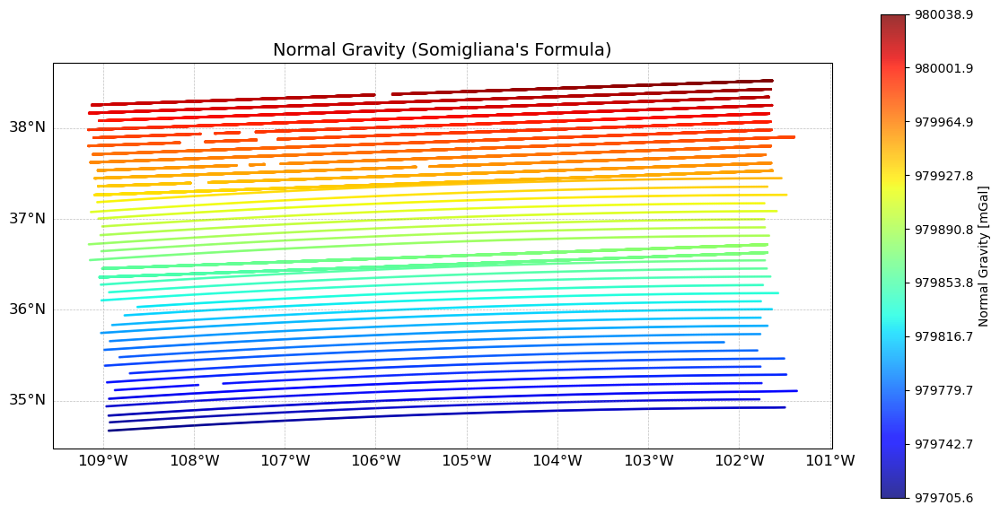

In [20]:
fig,ax = plot_dataframe_column_map(
    df=calculation_df,
    value_col='g_normal(mGal)',
    lat_col='Latitude(DD)',
    lon_col='Longitude(DD)',
    title='Normal Gravity (Somigliana\'s Formula)',
    colorbar_label='Normal Gravity [mGal]',
    cmap='jet',
    point_size=1,
    alpha=0.8,
    dpi=300
)


Plot saved to: Free_Air_Correction(mGal)_map_20250723_233617.jpeg


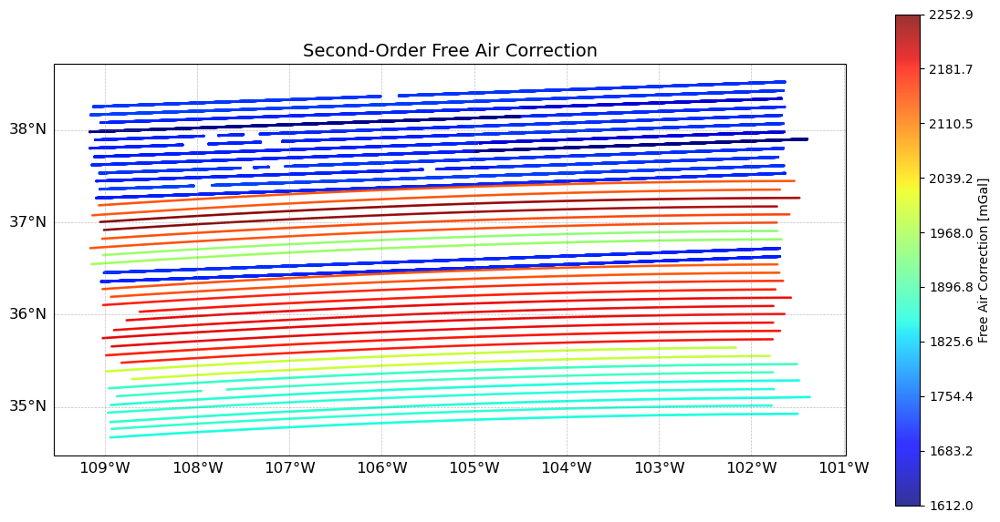

In [21]:
fig,ax = plot_dataframe_column_map(
    df=calculation_df,
    value_col='Free_Air_Correction(mGal)',
    lat_col='Latitude(DD)',
    lon_col='Longitude(DD)',
    title='Second-Order Free Air Correction',
    colorbar_label='Free Air Correction [mGal]',
    cmap='jet',
    point_size=1,
    alpha=0.8,
    dpi=300
)


Plot saved to: FAA(mGal)_map_20250723_233630.jpeg


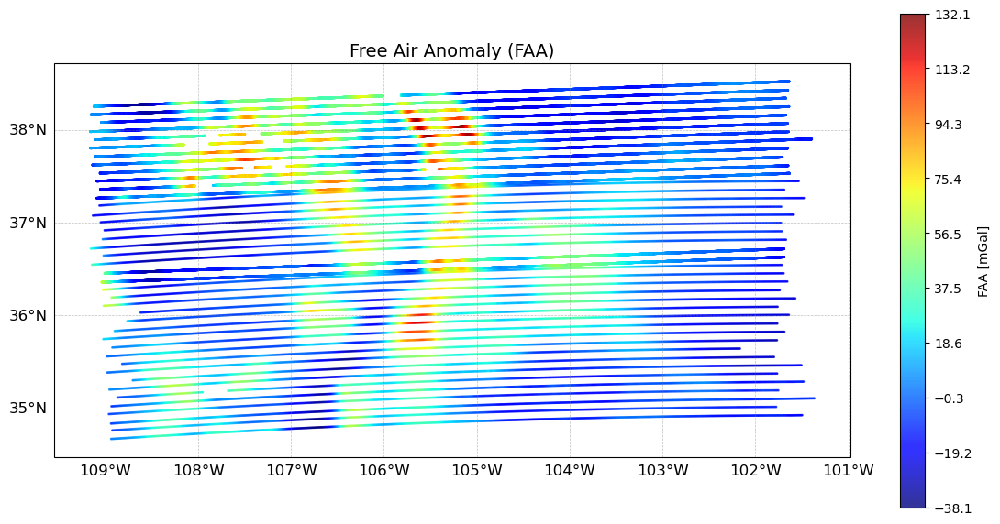

In [22]:
fig,ax = plot_dataframe_column_map(
    df=calculation_df,
    value_col='FAA(mGal)',
    lat_col='Latitude(DD)',
    lon_col='Longitude(DD)',
    title='Free Air Anomaly (FAA)',
    colorbar_label='FAA [mGal]',
    cmap='jet',
    point_size=1,
    alpha=0.8,
    dpi=300
)


Plot saved to: gravity_anomaly_s_mw(mGal)_map_20250723_233650.jpeg


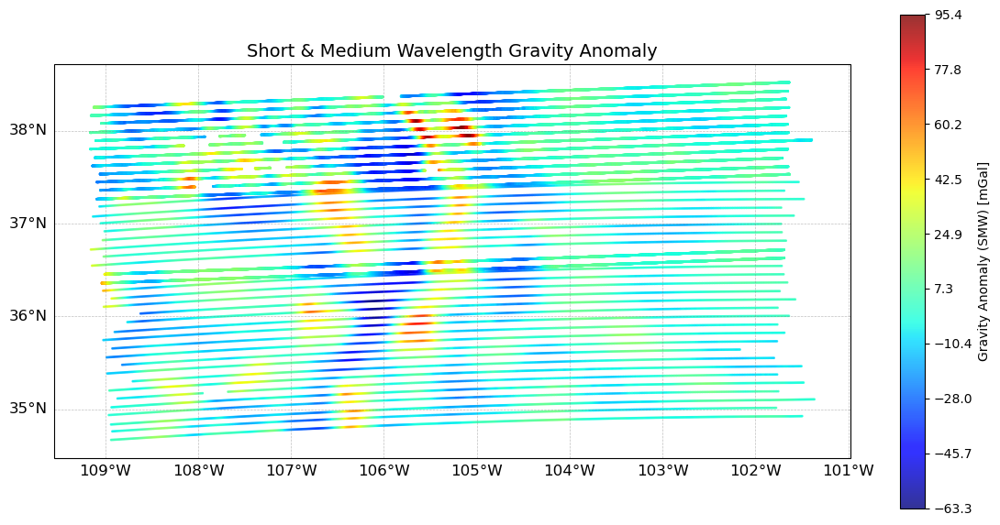

In [23]:
fig,ax = plot_dataframe_column_map(
    df=calculation_df,
    value_col='gravity_anomaly_s_mw(mGal)',
    lat_col='Latitude(DD)',
    lon_col='Longitude(DD)',
    title='Short & Medium Wavelength Gravity Anomaly',
    colorbar_label='Gravity Anomaly (SMW) [mGal]',
    cmap='jet',
    point_size=1,
    alpha=0.8,
    dpi=300
)


Plot saved to: delta_atm(mGal)_map_20250723_233709.jpeg


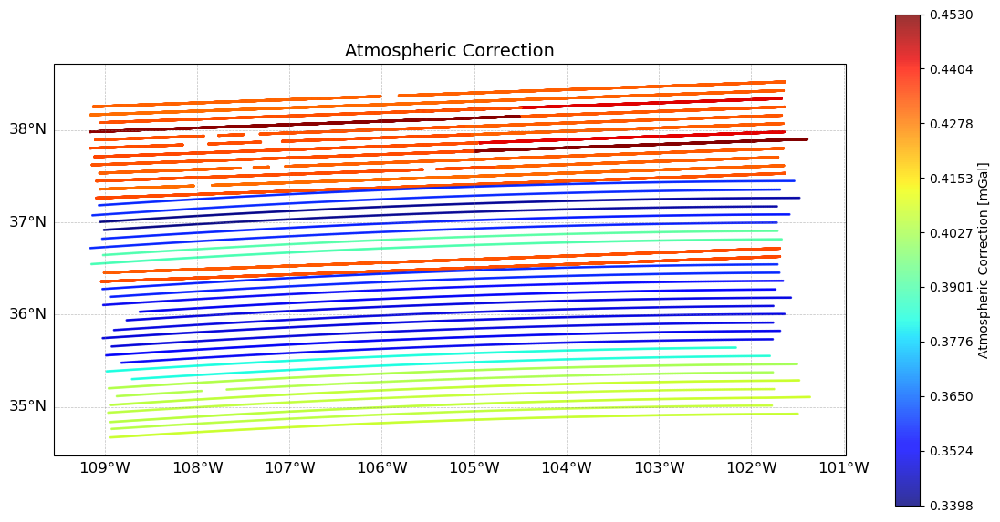

In [24]:
fig, ax = plot_dataframe_column_map(
    df=calculation_df,
    value_col='delta_atm(mGal)',
    lat_col='Latitude(DD)',
    lon_col='Longitude(DD)',
    title='Atmospheric Correction',
    colorbar_label='Atmospheric Correction [mGal]',
    cmap='jet',
    point_size=1,
    alpha=0.8,
    dpi=300
)


Plot saved to: gravity_anomaly_s_mw_atm(mGal)_map_20250723_233728.jpeg


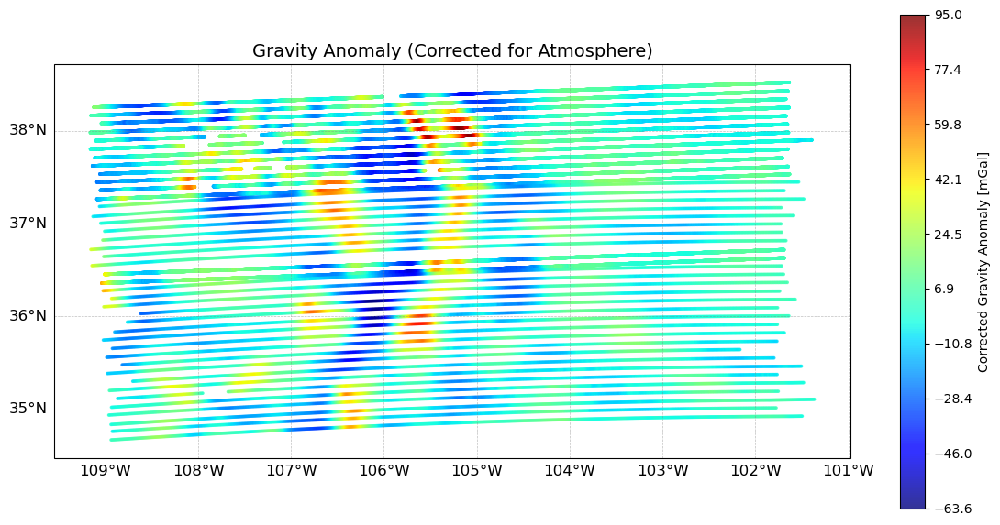

In [25]:
fig, ax = plot_dataframe_column_map(
    df=calculation_df,
    value_col='gravity_anomaly_s_mw_atm(mGal)',
    lat_col='Latitude(DD)',
    lon_col='Longitude(DD)',
    title='Gravity Anomaly (Corrected for Atmosphere)',
    colorbar_label='Corrected Gravity Anomaly [mGal]',
    cmap='jet',
    point_size=3,
    alpha=0.8,
    dpi=300
)


In [26]:
import seaborn as sns
import matplotlib.pyplot as plt
from scipy.stats import pearsonr

# Raw gravity vs Altitude
r_raw, _ = pearsonr(calculation_df['Altitude(m)'], calculation_df['Gravity(mGal)'])
# Anomaly corrected for atmosphere vs Altitude
r_corr, _ = pearsonr(calculation_df['Altitude(m)'], calculation_df['gravity_anomaly_s_mw_atm(mGal)'])

print(f"Pearson r (Raw Gravity vs Altitude): {r_raw:.4f}")
print(f"Pearson r (Corrected Anomaly vs Altitude): {r_corr:.4f}")


Pearson r (Raw Gravity vs Altitude): -0.8920
Pearson r (Corrected Anomaly vs Altitude): -0.0234


In [27]:
# Path to DEM file
# "C:\Users\SREEKANTH\Documents\Geoid_Modelling_V4\DEM\n37_w108_1arc_v3.tif"

dem_path = r"C:\Users\SREEKANTH\Documents\Geoid_Modelling_V5\DATA\COLORADO\DEM\n37_w108_1arc_v3.tif"

# Read the DEM
with rasterio.open(dem_path) as dem:
    dem_array = dem.read(1).astype(float)  # Convert to float for proper visualization
    transform = dem.transform  # Get affine transformation
    height, width = dem_array.shape  # DEM dimensions
    nodata_value = dem.nodata  # No-data value

# Replace nodata values with NaN for better visualization
dem_array[dem_array == nodata_value] = np.nan

In [28]:
# Generate longitude and latitude grids
cols, rows = np.meshgrid(np.arange(width), np.arange(height))
lon_grid, lat_grid = rasterio.transform.xy(transform, rows, cols)

# Convert lists to NumPy arrays
lon_grid = np.array(lon_grid)
lat_grid = np.array(lat_grid)

In [29]:
# Extract relevant data
df_lon = calculation_df['Longitude(DD)']
df_lat = calculation_df['Latitude(DD)']
df_values = calculation_df['gravity_anomaly_s_mw_atm(mGal)']
# Interpolate scattered data to grid
gravity_anomaly_grid_values = griddata((df_lon, df_lat), df_values, (lon_grid, lat_grid), method='linear')


In [30]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
from matplotlib.ticker import MultipleLocator
from datetime import datetime

def plot_2d_array_on_map(
    data_array, 
    lat_grid, 
    lon_grid, 
    title, 
    cmap='jet', 
    unit_label='Value', 
    dpi=300
):
    """
    Plot a 2D data array (e.g., DEM) over a latitude/longitude grid using Cartopy.
    Saves the plot with a timestamped filename.

    Parameters:
        data_array (2D numpy array): The array to plot (e.g., elevation, temperature).
        lat_grid (2D numpy array): Latitude grid corresponding to the data array.
        lon_grid (2D numpy array): Longitude grid corresponding to the data array.
        title (str): Title for the plot.
        cmap (str): Colormap for the plot (default is 'jet').
        unit_label (str): Label for the colorbar (default is 'Value').
        dpi (int): Resolution of the saved figure (default is 300).
    """
    # Determine min, max, and colorbar ticks
    vmin = np.nanmin(data_array)
    vmax = np.nanmax(data_array)
    #vmin = data_array.min()
    #vmax = data_array.max()
    ticks = np.linspace(vmin, vmax, 10)

    # Create figure and axes
    fig = plt.figure(figsize=(14, 10))
    ax = plt.axes(projection=ccrs.PlateCarree())

    # Plot the data
    mesh = ax.pcolormesh(
        lon_grid,
        lat_grid,
        data_array,
        shading='auto',
        cmap=cmap,
        vmin=vmin,
        vmax=vmax,
        transform=ccrs.PlateCarree()
    )

    # Add gridlines
    gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--')
    gl.top_labels = False
    gl.right_labels = False
    gl.xlabel_style = {'size': 12}
    gl.ylabel_style = {'size': 12}
    gl.xformatter = LONGITUDE_FORMATTER
    gl.yformatter = LATITUDE_FORMATTER
    gl.xlocator = MultipleLocator(0.2)
    gl.ylocator = MultipleLocator(0.2)

    # Add colorbar
    cbar = plt.colorbar(mesh, ax=ax, orientation='vertical', label=unit_label, shrink=0.7)
    cbar.set_ticks(ticks)

    # Add title
    plt.title(title, fontsize=14)

    # Generate a timestamped filename
    timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')
    filename = f"{title.replace(' ', '_')}_map_{timestamp}.jpeg"

    # Save the plot with the generated filename
    plt.savefig(filename, dpi=dpi, bbox_inches='tight')
    print(f"Plot saved to: {filename}")

    # Show plot
    plt.show()
    return fig, ax


Plot saved to: Gravity_Anomaly_Short_and_Medium_wave_interpolated_for_Modeling_Region_map_20250723_233825.jpeg


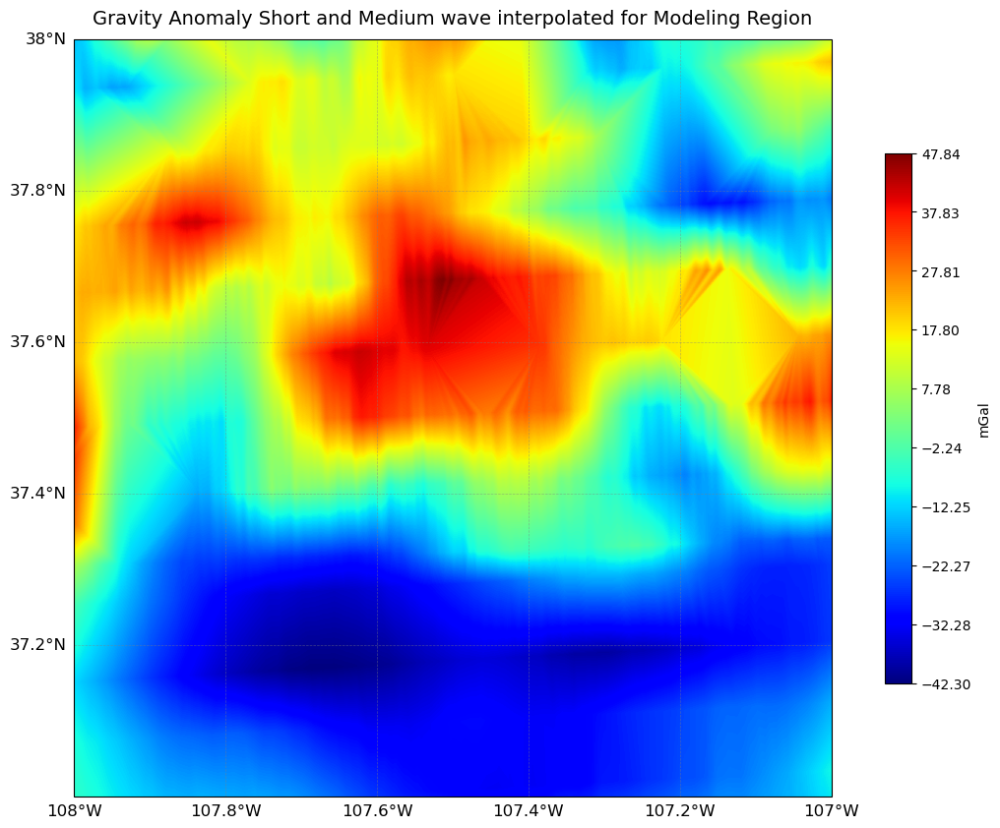

In [31]:
# Plot the gravity anomaly grid values
fig,ax = plot_2d_array_on_map(
    data_array=gravity_anomaly_grid_values, 
    lat_grid=lat_grid, 
    lon_grid=lon_grid, 
    title='Gravity Anomaly Short and Medium wave interpolated for Modeling Region', 
    cmap='jet',
    unit_label= 'mGal'
)


Plot saved to: gravity_anomaly_overlay_map_20250723_233912.jpeg


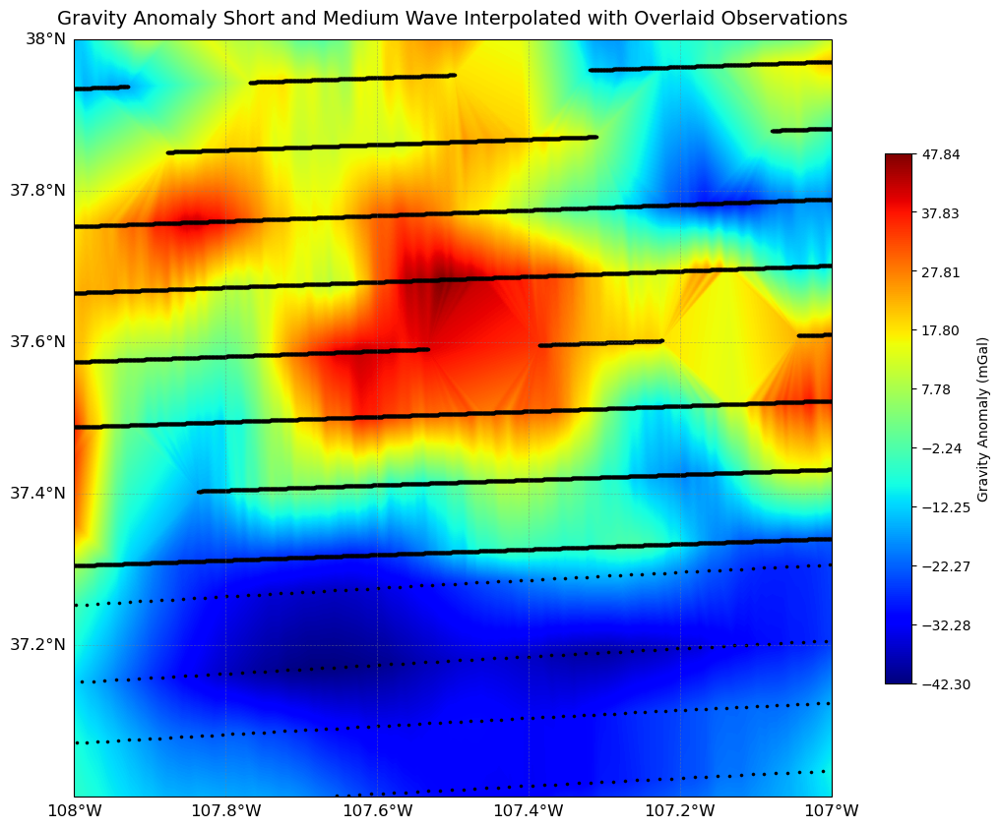

In [32]:
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
from matplotlib.ticker import MultipleLocator
from datetime import datetime

# --- Filter the data within the modeling region ---
filtered_data = calculation_df[
    (calculation_df['Latitude(DD)'] >= 37) & 
    (calculation_df['Latitude(DD)'] < 38) & 
    (calculation_df['Longitude(DD)'] >= -108) & 
    (calculation_df['Longitude(DD)'] < -107)
]

# --- Define color range and ticks from interpolated grid values ---
vmin = gravity_anomaly_grid_values.min()
vmax = gravity_anomaly_grid_values.max()
ticks = np.linspace(vmin, vmax, 10)

# --- Create the plot ---
fig = plt.figure(figsize=(14, 10))
ax = plt.axes(projection=ccrs.PlateCarree())

# --- Plot the interpolated grid as the background ---
mesh = ax.pcolormesh(
    lon_grid,
    lat_grid,
    gravity_anomaly_grid_values,
    shading='auto',
    cmap='jet',
    vmin=vmin,
    vmax=vmax,
    transform=ccrs.PlateCarree()
)

# --- Overlay observed point data (scatter) as solid black dots ---
sc = ax.scatter(
    filtered_data['Longitude(DD)'],
    filtered_data['Latitude(DD)'],
    color='black',  # Set color to black for solid dots
    s=5,           # Adjust size for visibility
    edgecolor='black',
    linewidth=0.3,
    transform=ccrs.PlateCarree(),
    alpha=1,        # Fully opaque dots
    label='Observed Points'
)

# --- Gridlines and formatting ---
gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 12}
gl.ylabel_style = {'size': 12}
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER
gl.xlocator = MultipleLocator(0.2)
gl.ylocator = MultipleLocator(0.2)

# --- Colorbar ---
cbar = plt.colorbar(mesh, ax=ax, orientation='vertical', label='Gravity Anomaly (mGal)', shrink=0.7)
cbar.set_ticks(ticks)

# --- Title and legend ---
plt.title('Gravity Anomaly Short and Medium Wave Interpolated with Overlaid Observations', fontsize=14)
# ax.legend(loc='upper right', fontsize=10)

# --- Save the figure ---
timestamp = datetime.now().strftime('%Y%m%d_%H%M%S')
filename = f"gravity_anomaly_overlay_map_{timestamp}.jpeg"
plt.savefig(filename, dpi=300, bbox_inches='tight')
print(f"Plot saved to: {filename}")

# --- Show plot ---
plt.show()


Plot saved to: Digital_Elevation_Model_map_20250723_234011.jpeg


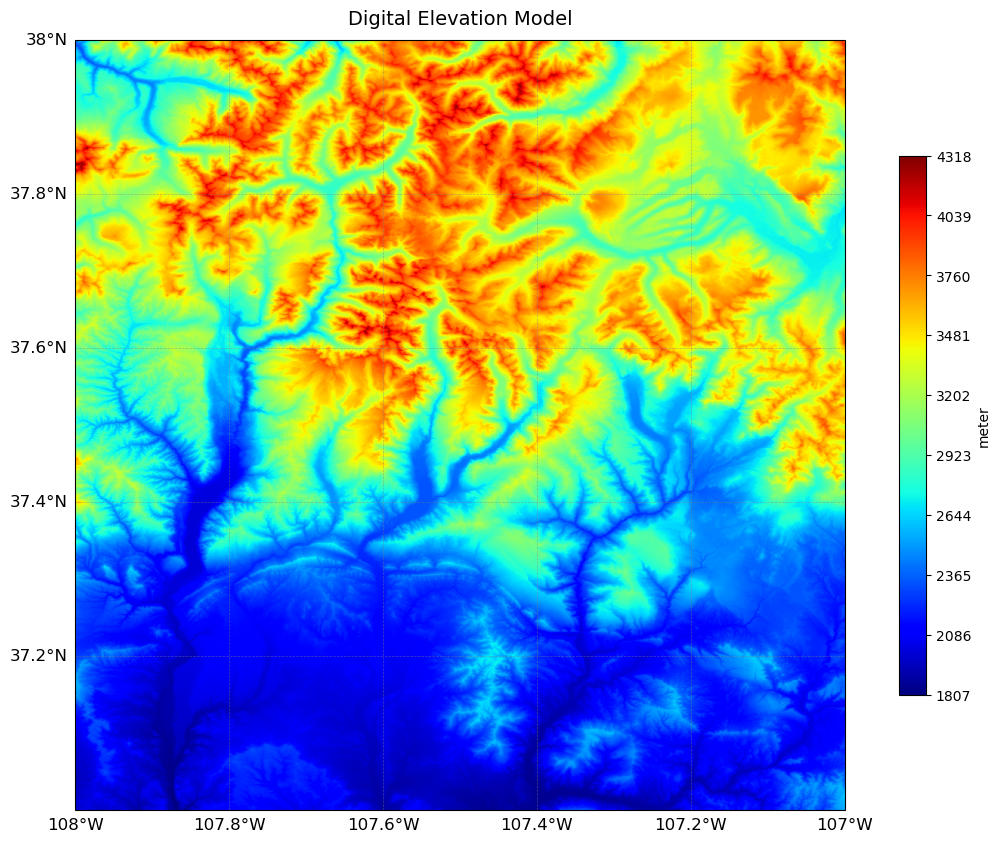

In [33]:
# Plot the gravity anomaly grid values
fig,ax = plot_2d_array_on_map(
    data_array=dem_array, 
    lat_grid=lat_grid, 
    lon_grid=lon_grid, 
    title='Digital Elevation Model', 
    cmap='jet',
    unit_label= 'meter'
)


In [34]:
import numpy as np
from scipy.stats import pearsonr

# Flatten the 2D arrays and remove NaNs
dem_flat = dem_array.flatten()
anom_flat = gravity_anomaly_grid_values.flatten()

# Mask to remove invalid or missing values
mask = ~np.isnan(dem_flat) & ~np.isnan(anom_flat)

# Apply mask
dem_clean = dem_flat[mask]
anom_clean = anom_flat[mask]

# Compute Pearson correlation
r, p_value = pearsonr(dem_clean, anom_clean)

print(f"Pearson correlation coefficient (r): {r:.4f}")
print(f"P-value: {p_value:.4e}")


Pearson correlation coefficient (r): 0.8305
P-value: 0.0000e+00


Pearson correlation (full data): r = 0.8305, p = 0.00e+00


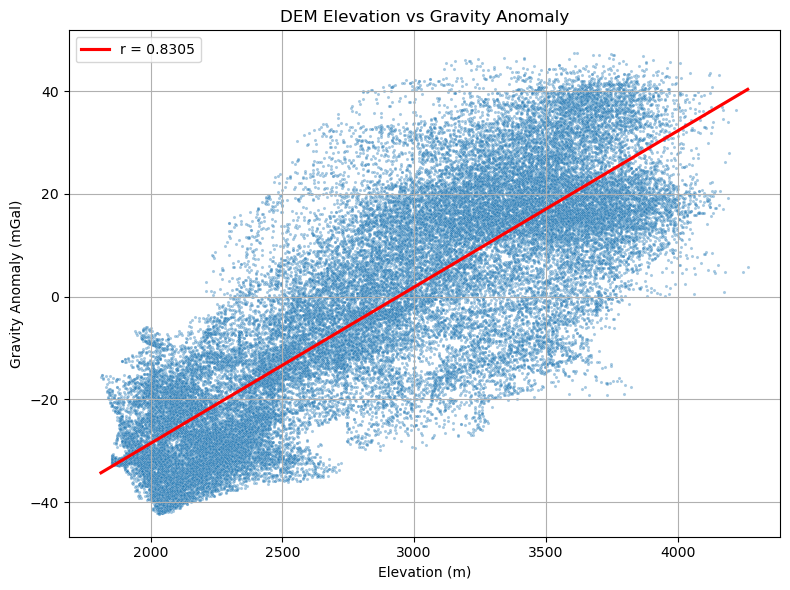

In [35]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr

# Flatten arrays
dem_flat = dem_array.flatten()
anom_flat = gravity_anomaly_grid_values.flatten()

# Remove NaNs
mask = ~np.isnan(dem_flat) & ~np.isnan(anom_flat)
dem_clean = dem_flat[mask]
anom_clean = anom_flat[mask]

# Optional: Downsample for speed (e.g., 50,000 points)
sample_size = 50000
if len(dem_clean) > sample_size:
    indices = np.random.choice(len(dem_clean), sample_size, replace=False)
    dem_sample = dem_clean[indices]
    anom_sample = anom_clean[indices]
else:
    dem_sample = dem_clean
    anom_sample = anom_clean

# Compute correlation on full data
r, p_value = pearsonr(dem_clean, anom_clean)
print(f"Pearson correlation (full data): r = {r:.4f}, p = {p_value:.2e}")

# Plot using sample
plt.figure(figsize=(8, 6))
sns.scatterplot(x=dem_sample, y=anom_sample, s=5, alpha=0.4)
sns.regplot(x=dem_sample, y=anom_sample, scatter=False, color='red', label=f"r = {r:.4f}")
plt.title("DEM Elevation vs Gravity Anomaly")
plt.xlabel("Elevation (m)")
plt.ylabel("Gravity Anomaly (mGal)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig('dem_vs_anomaly.jpeg', dpi=300, bbox_inches='tight')
plt.show()


In [37]:
import numpy as np
from scipy.fft import fft2, ifft2, fftshift

def compute_terrain_correction_fft(dem_array, dx=30, dy=30, rho=2670, G=6.67430e-11):
    """
    Compute terrain correction using FFT-based method on a given DEM array.

    Parameters:
    -----------
    dem_array : 2D numpy.ndarray
        The digital elevation model (DEM) grid in meters.
    dx : float, optional
        Grid spacing in the x-direction (east-west) in meters. Default is 30.
    dy : float, optional
        Grid spacing in the y-direction (north-south) in meters. Default is 30.
    rho : float, optional
        Density of the crust in kg/m³. Default is 2670.
    G : float, optional
        Gravitational constant in m³/kg/s². Default is 6.67430e-11.

    Returns:
    --------
    TC_mgal : 2D numpy.ndarray
        Terrain correction in mGal.
    """
    ny, nx = dem_array.shape
    h_q = dem_array.astype(np.float64)

    # Generate index grid
    x = np.arange(-nx//2, nx//2, dtype=np.float64) * dx
    y = np.arange(-ny//2, ny//2, dtype=np.float64) * dy
    X, Y = np.meshgrid(x, y)

    # Compute radial distance and kernel
    r = np.sqrt(X**2 + Y**2)
    r[r == 0] = np.inf  # Avoid division by zero
    K = (1 / r**3) * dx * dy
    K = fftshift(K)

    # Perform FFT-based convolution
    F_HQ2 = fft2(h_q**2)
    F_HQ = fft2(h_q)
    F_K = fft2(K)

    I1 = ifft2(F_HQ2 * F_K).real
    I2 = ifft2(fft2(np.ones_like(h_q)) * F_K).real
    I3 = ifft2(F_HQ * F_K).real

    # Terrain correction in mGal
    TC = (G * rho / 2) * (I1 + h_q**2 * I2 - 2 * h_q * I3)
    TC_mgal = TC * 1e5

    return TC_mgal


In [38]:
TC_mgal = compute_terrain_correction_fft(dem_array)

In [39]:
import numpy as np
from scipy.signal import fftconvolve

def compute_terrain_correction_tiled(dem_array, tile_size=1024, pad=100, dx=30, dy=30, rho=2670, G=6.67430e-11):
    """
    Compute terrain correction in tiles using FFT-based convolution to handle large DEM arrays.

    Parameters:
    -----------
    dem_array : 2D numpy.ndarray
        Digital elevation model (DEM) grid in meters.
    tile_size : int, optional
        Size of each square tile (e.g., 1024x1024). Default is 1024.
    pad : int, optional
        Padding size around each tile to minimize edge effects. Default is 100.
    dx, dy : float
        Grid spacing in x and y directions in meters. Defaults are 30 m.
    rho : float, optional
        Density of the crust in kg/m³. Default is 2670.
    G : float, optional
        Gravitational constant in m³/kg/s². Default is 6.67430e-11.

    Returns:
    --------
    full_tc_mgal : 2D numpy.ndarray
        Terrain correction in mGal, same shape as input DEM.
    """
    ny, nx = dem_array.shape
    full_tc_mgal = np.zeros_like(dem_array, dtype=np.float64)

    def compute_tile(h_q):
        ty, tx = h_q.shape
        x = np.arange(-tx//2, tx//2) * dx
        y = np.arange(-ty//2, ty//2) * dy
        X, Y = np.meshgrid(x, y)
        r = np.sqrt(X**2 + Y**2)
        r[r == 0] = np.inf  # Avoid division by zero
        K = (1 / r**3) * dx * dy

        I1 = fftconvolve(h_q**2, K, mode='same')
        I2 = fftconvolve(np.ones_like(h_q), K, mode='same')
        I3 = fftconvolve(h_q, K, mode='same')

        TC = (G * rho / 2) * (I1 + h_q**2 * I2 - 2 * h_q * I3)
        return TC * 1e5  # Convert to mGal

    for y_start in range(0, ny, tile_size):
        for x_start in range(0, nx, tile_size):
            y_end = min(y_start + tile_size, ny)
            x_end = min(x_start + tile_size, nx)

            # Determine padded bounds
            yp_start = max(y_start - pad, 0)
            yp_end = min(y_end + pad, ny)
            xp_start = max(x_start - pad, 0)
            xp_end = min(x_end + pad, nx)

            # Extract padded tile
            padded_tile = dem_array[yp_start:yp_end, xp_start:xp_end]

            # Compute terrain correction on padded tile
            tc_padded = compute_tile(padded_tile)

            # Extract central (unpadded) region
            y0 = y_start - yp_start
            y1 = y0 + (y_end - y_start)
            x0 = x_start - xp_start
            x1 = x0 + (x_end - x_start)

            full_tc_mgal[y_start:y_end, x_start:x_end] = tc_padded[y0:y1, x0:x1]

    return full_tc_mgal



In [40]:
TC_mgal2 = compute_terrain_correction_tiled(dem_array, tile_size=1024, pad=100)

Plot saved to: Naïve_FFT-Based_Terrain_Correction_(No_Padding)_map_20250723_234221.jpeg


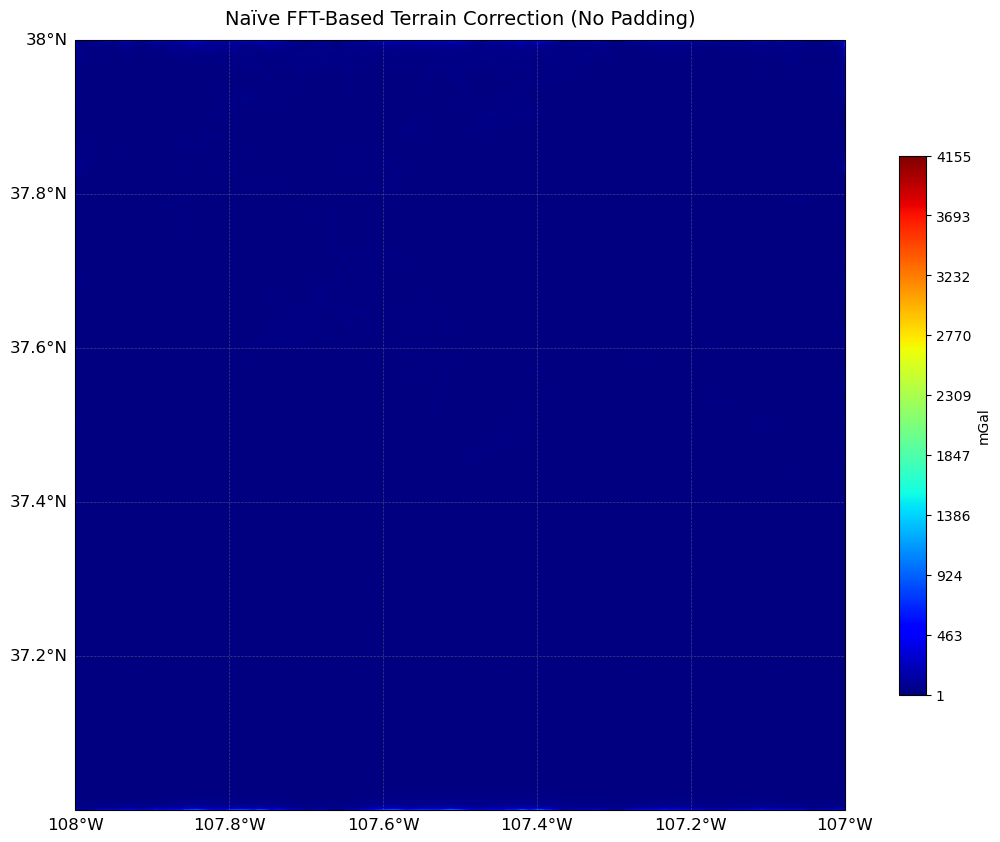

In [41]:
fig,ax = plot_2d_array_on_map(
    data_array=TC_mgal, 
    lat_grid=lat_grid, 
    lon_grid=lon_grid, 
    title='Naïve FFT-Based Terrain Correction (No Padding)', 
    cmap='jet',
    unit_label= 'mGal'
)

Plot saved to: Tiled_FFT_Terrain_Correction_Using_fftconvolve_(With_Padding)_map_20250723_234258.jpeg


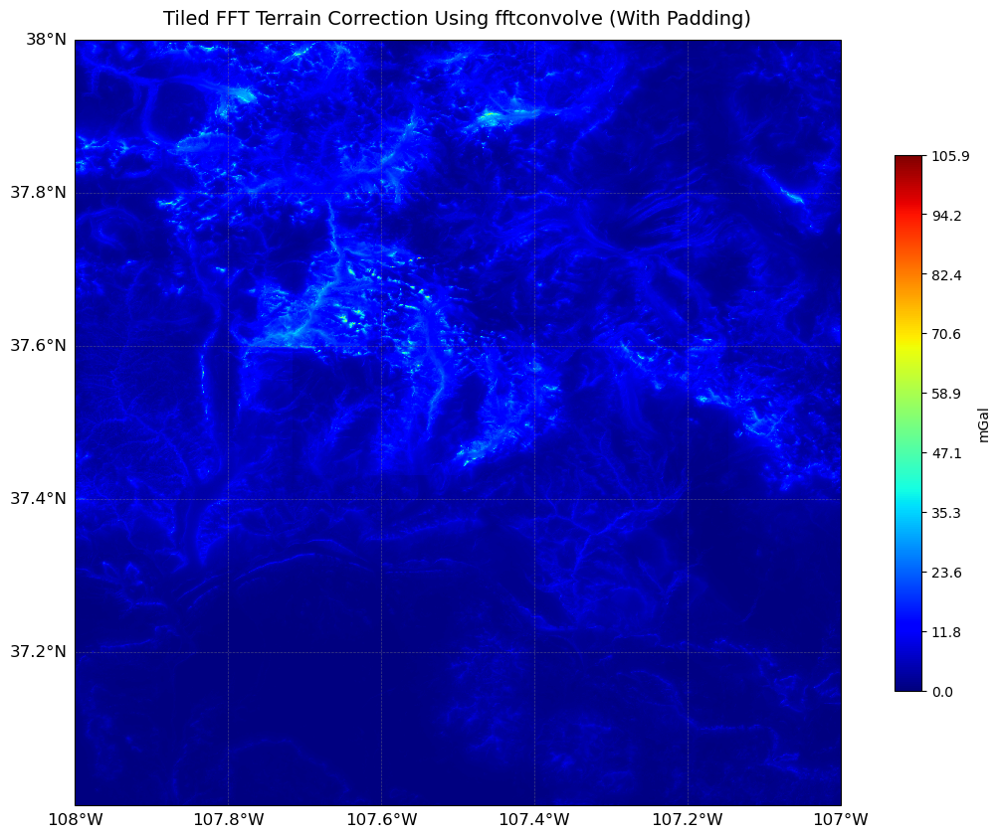

In [42]:
fig,ax = plot_2d_array_on_map(
    data_array=TC_mgal2, 
    lat_grid=lat_grid, 
    lon_grid=lon_grid, 
    title='Tiled FFT Terrain Correction Using fftconvolve (With Padding)', 
    cmap='jet',
    unit_label= 'mGal'
)

In [43]:
import numpy as np

# Apply 3-sigma clipping to remove harsh outliers primaly due to edge effect of FFT
mean_dN = np.mean(TC_mgal)
std_dN = np.std(TC_mgal)
CI = mean_dN + 3 * std_dN
CN = mean_dN - 3 * std_dN

TC_filtered_grid = np.copy(TC_mgal)
TC_filtered_grid[(TC_filtered_grid > CI) | (TC_filtered_grid < CN)] = mean_dN

Plot saved to: Sigma-Clipped_FFT_Terrain_Correction_map_20250723_234335.jpeg


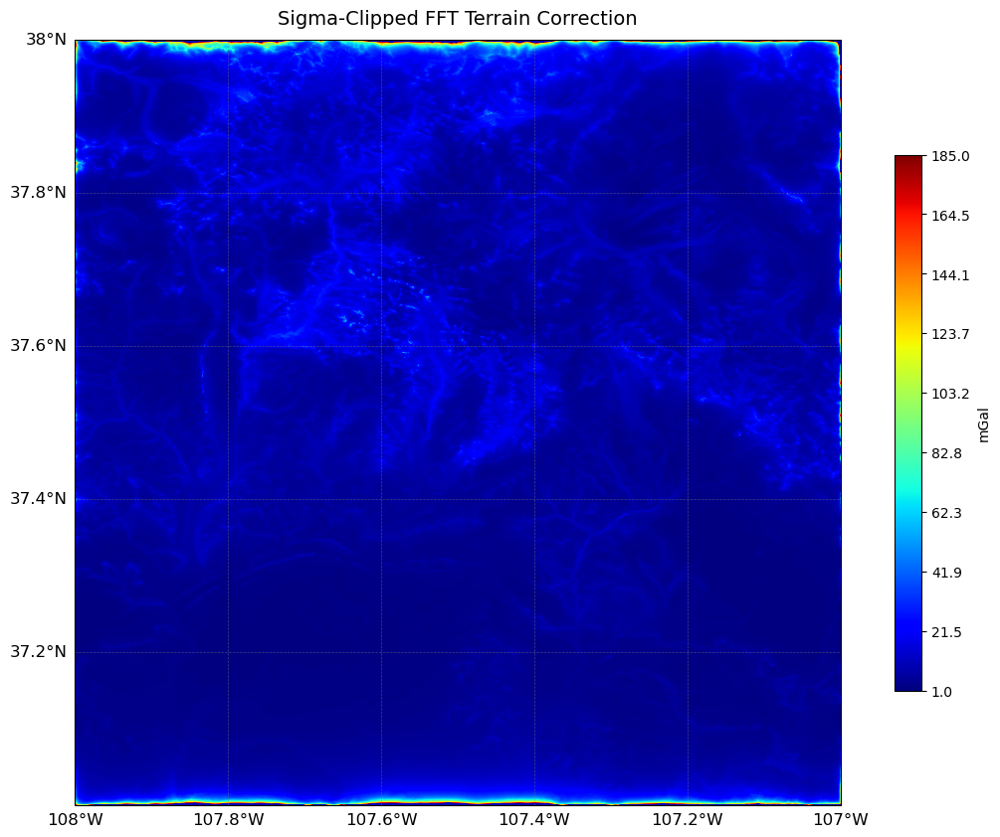

In [44]:
fig,ax = plot_2d_array_on_map(
    data_array=TC_filtered_grid,
    lat_grid=lat_grid, 
    lon_grid=lon_grid, 
    title='Sigma-Clipped FFT Terrain Correction', 
    cmap='jet',
    unit_label= 'mGal'
)

In [45]:
faye_anomaly_grid = gravity_anomaly_grid_values -  TC_mgal2

Plot saved to: Faye_Anomaly_map_20250723_234411.jpeg


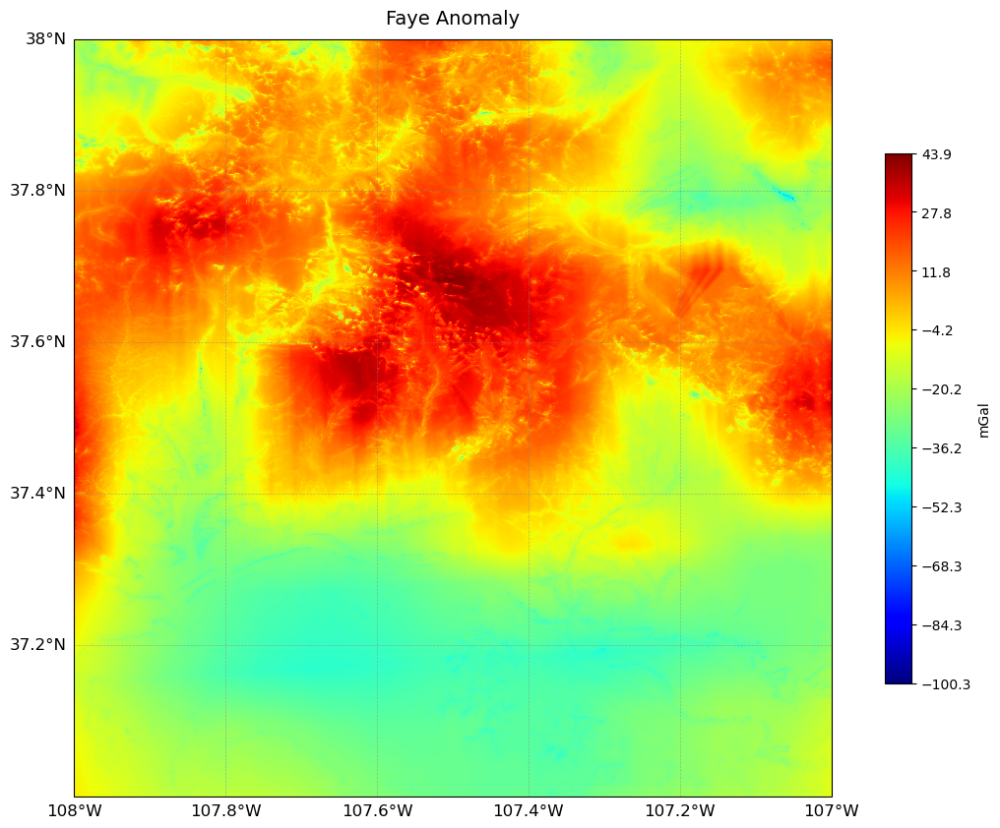

In [46]:
# Plot the gravity anomaly grid values
fig,ax = plot_2d_array_on_map(
    data_array=faye_anomaly_grid, 
    lat_grid=lat_grid, 
    lon_grid=lon_grid, 
    title='Faye Anomaly', 
    cmap='jet',
    unit_label= 'mGal'
)

Pearson correlation (DEM vs Faye anomaly): r = 0.8023, p = 0.00e+00


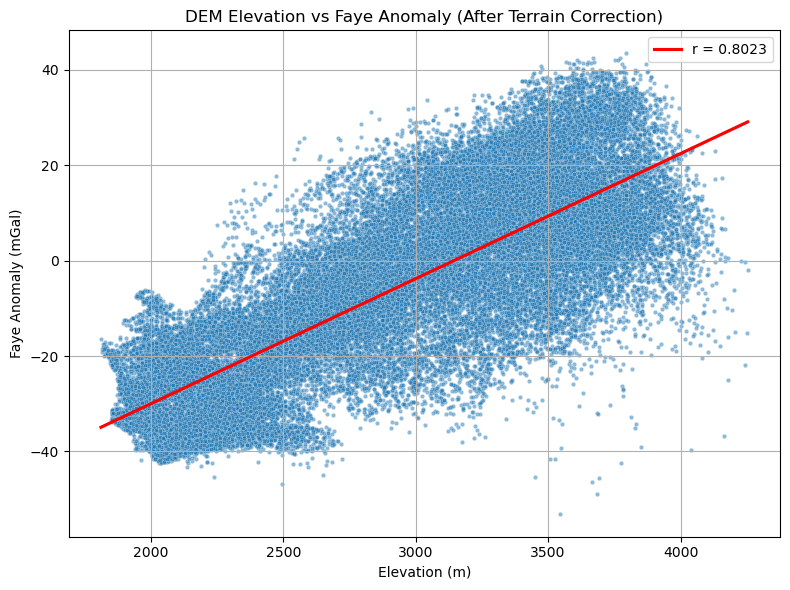

In [47]:
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
from scipy.stats import pearsonr

# Flatten and clean both arrays
dem_flat = dem_array.flatten()
faye_flat = faye_anomaly_grid.flatten()

# Remove NaNs
mask = ~np.isnan(dem_flat) & ~np.isnan(faye_flat)
dem_clean = dem_flat[mask]
faye_clean = faye_flat[mask]

# Downsample for plotting (optional)
sample_size = 50000
if len(dem_clean) > sample_size:
    indices = np.random.choice(len(dem_clean), sample_size, replace=False)
    dem_sample = dem_clean[indices]
    faye_sample = faye_clean[indices]
else:
    dem_sample = dem_clean
    faye_sample = faye_clean

# Pearson correlation
r, p = pearsonr(dem_clean, faye_clean)
print(f"Pearson correlation (DEM vs Faye anomaly): r = {r:.4f}, p = {p:.2e}")

# Scatter plot with regression line
plt.figure(figsize=(8, 6))
sns.scatterplot(x=dem_sample, y=faye_sample, alpha=0.5, s=10)
sns.regplot(x=dem_sample, y=faye_sample, scatter=False, color='red', label=f"r = {r:.4f}")
plt.title("DEM Elevation vs Faye Anomaly (After Terrain Correction)")
plt.xlabel("Elevation (m)")
plt.ylabel("Faye Anomaly (mGal)")
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.show()


In [48]:
# Compute gradients (in mGal per grid cell)
gx_faye, gy_faye = np.gradient(faye_anomaly_grid)
gx_smw, gy_smw = np.gradient(gravity_anomaly_grid_values)

# RMS of gradients
rms_grad_faye = np.sqrt(np.mean(gx_faye**2 + gy_faye**2))
rms_grad_smw = np.sqrt(np.mean(gx_smw**2 + gy_smw**2))

print(f"RMS Gradient (SMW anomaly): {rms_grad_smw:.3f}")
print(f"RMS Gradient (Faye anomaly): {rms_grad_faye:.3f}")


RMS Gradient (SMW anomaly): 0.073
RMS Gradient (Faye anomaly): 0.584


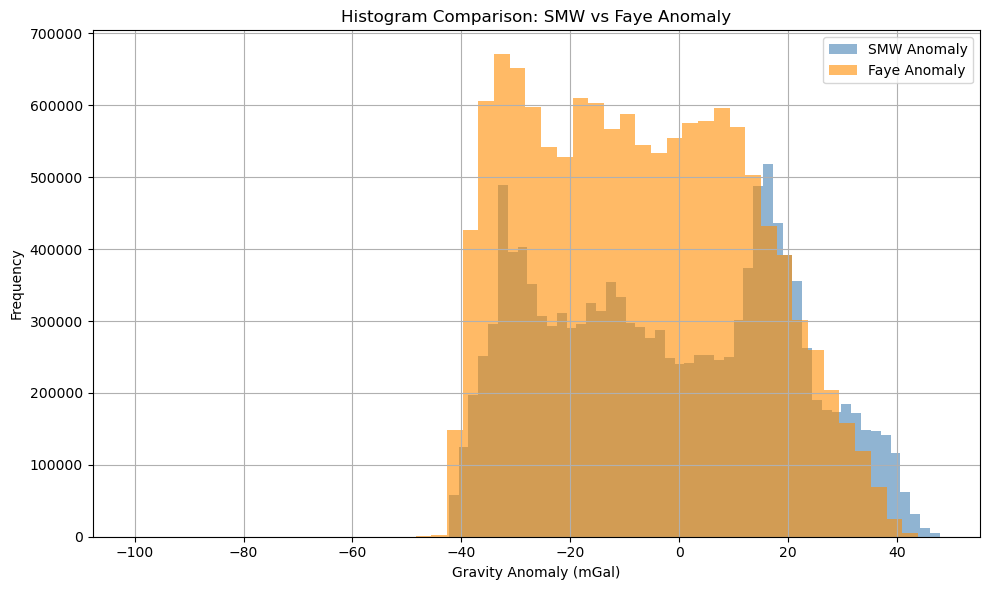

In [49]:
import numpy as np
import matplotlib.pyplot as plt

# Flatten arrays and remove NaNs
smw_flat = gravity_anomaly_grid_values.flatten()
faye_flat = faye_anomaly_grid.flatten()

# Mask to keep only valid data
mask = ~np.isnan(smw_flat) & ~np.isnan(faye_flat)
smw_clean = smw_flat[mask]
faye_clean = faye_flat[mask]

# Plot histograms
plt.figure(figsize=(10, 6))
bins = 50

plt.hist(smw_clean, bins=bins, alpha=0.6, color='steelblue', label='SMW Anomaly')
plt.hist(faye_clean, bins=bins, alpha=0.6, color='darkorange', label='Faye Anomaly')

plt.title('Histogram Comparison: SMW vs Faye Anomaly')
plt.xlabel('Gravity Anomaly (mGal)')
plt.ylabel('Frequency')
plt.legend()
plt.grid(True)
plt.tight_layout()
plt.savefig('hist_smw_faye.jpeg', dpi=300, bbox_inches='tight')
plt.show()


In [50]:
import numpy as np
from scipy.fft import fft2, ifft2, fftshift

def compute_spherical_stokes_convolution(
    faye_anomaly_grid,
    lat_grid,
    lon_grid,
    R=6371000,
    arcsec_resolution=1
):
    """
    Compute the geoid undulation contribution using spherical Stokes convolution
    via FFT based on a grid of Faye gravity anomalies.

    Parameters:
    -----------
    faye_anomaly_grid : 2D numpy.ndarray
        Grid of Faye gravity anomalies (in mGal).
    lat_grid : 2D numpy.ndarray
        Latitude grid in decimal degrees (same shape as faye_anomaly_grid).
    lon_grid : 2D numpy.ndarray
        Longitude grid in decimal degrees (same shape as faye_anomaly_grid).
    R : float, optional
        Mean Earth radius in meters. Default is 6371000.
    arcsec_resolution : float, optional
        Grid resolution in arc-seconds. Default is 1 (i.e., 1 arc-second resolution).

    Returns:
    --------
    T_r_m2_per_s2 : 2D numpy.ndarray
        Result of the Stokes convolution (in m²/s²).
    """
    ny, nx = faye_anomaly_grid.shape

    # Convert to radians
    lat_rad = np.deg2rad(lat_grid).astype(np.float64)
    lon_rad = np.deg2rad(lon_grid).astype(np.float64)

    # Get center point
    i_center = ny // 2
    j_center = nx // 2
    lat_p = lat_rad[i_center, j_center]
    lon_p = lon_rad[i_center, j_center]

    # Compute sin²(ψ/2)
    sin_psi_by_2_squared = (
        np.sin((lat_p - lat_rad) / 2)**2 +
        np.cos(lat_p) * np.cos(lat_rad) * np.sin((lon_p - lon_rad) / 2)**2
    )
    sin_psi_by_2 = np.sqrt(sin_psi_by_2_squared)
    sin_psi_by_2[i_center, j_center] = np.nan  # exclude center point

    # Clamp and sanitize
    sin_psi_by_2 = np.clip(sin_psi_by_2, 0, 1)
    sin_psi_by_2 = np.nan_to_num(sin_psi_by_2, nan=1e-10)
    psi = 2 * np.arcsin(sin_psi_by_2)

    # Compute Stokes kernel S(ψ)
    with np.errstate(divide='ignore', invalid='ignore'):
        S_psi = (
            (1 / sin_psi_by_2) -
            6 * sin_psi_by_2 +
            1 -
            5 * np.cos(psi) -
            3 * np.cos(psi) * np.log(np.maximum(sin_psi_by_2 + sin_psi_by_2_squared, 1e-10))
        )
    S_psi[i_center, j_center] = 0  # Set singular point to zero

    # Compute area element correction (1 arcsec resolution)
    dx = dy = (arcsec_resolution / 3600) * (np.pi / 180)  # arc-sec to radians
    cos_phi = np.cos(lat_rad)
    S_psi *= cos_phi * dx * dy

    # Apply FFT-based convolution
    F_S_psi = fft2(fftshift(S_psi))
    F_faye = fft2(faye_anomaly_grid)
    T_r = (R / (4 * np.pi)) * ifft2(F_faye * F_S_psi).real

    # Convert result to m²/s²
    T_r_m2_per_s2 = T_r * 1e-5

    return T_r_m2_per_s2


In [51]:
T_r = compute_spherical_stokes_convolution(faye_anomaly_grid, lat_grid, lon_grid)

Plot saved to: Disturbing_Potential_map_20250723_234514.jpeg


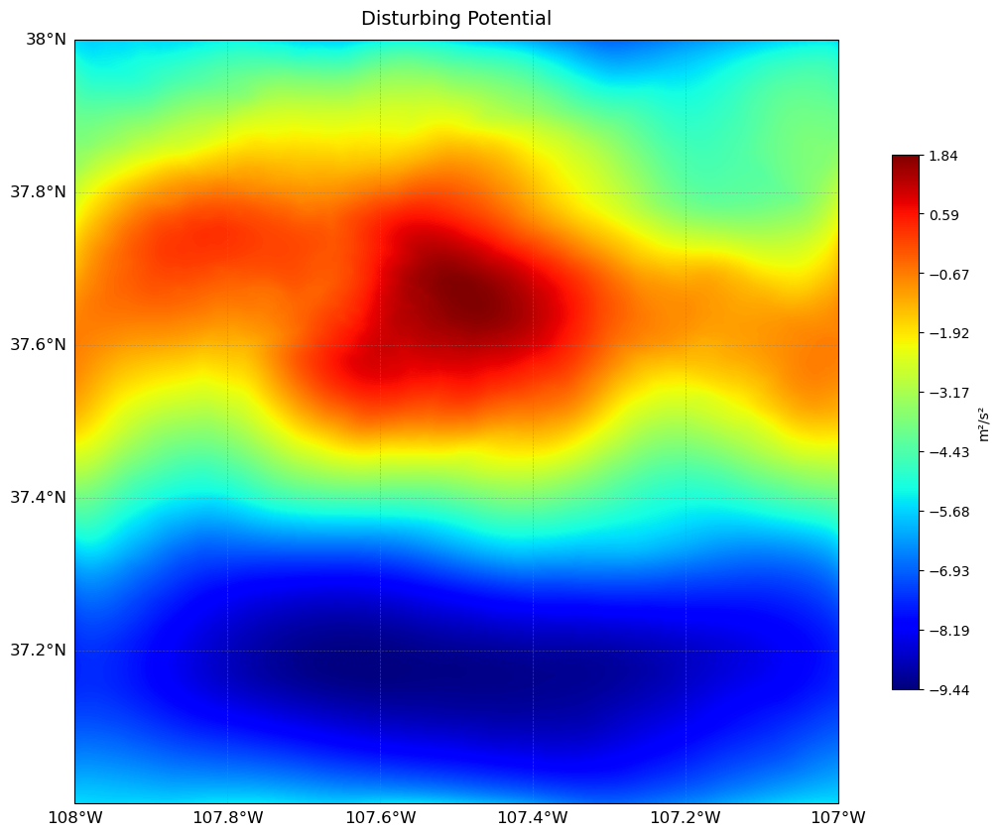

In [52]:
# Plot the gravity anomaly grid values
fig,ax = plot_2d_array_on_map(
    data_array=T_r, 
    lat_grid=lat_grid, 
    lon_grid=lon_grid, 
    title='Disturbing Potential', 
    cmap='jet',
    unit_label= 'm²/s²'
)

In [53]:
import numpy as np

def compute_normal_gravity_grid(lat_grid):
    """
    Compute the normal gravity on the WGS84 ellipsoid for each point in a latitude grid.

    Parameters:
    -----------
    lat_grid : 2D numpy.ndarray
        Latitude grid in decimal degrees.

    Returns:
    --------
    g_normal_grid : 2D numpy.ndarray
        Grid of normal gravity values (in m/s²).
    """

    # Ellipsoidal constants (WGS 84)
    a = 6378137.0               # Semi-major axis (meters)
    b = 6356752.3142            # Semi-minor axis (meters)
    gamma_eq = 9.7803253359     # Normal gravity at equator (m/s²)
    gamma_pole = 9.8321849378   # Normal gravity at pole (m/s²)

    # Convert latitude to radians
    lat_rad = np.radians(lat_grid)

    # Compute normal gravity
    g_normal_grid = (
        (a * gamma_eq * np.cos(lat_rad)**2) +
        (b * gamma_pole * np.sin(lat_rad)**2)
    ) / (
        np.sqrt((a**2 * np.cos(lat_rad)**2) +
                (b**2 * np.sin(lat_rad)**2))
    )

    return g_normal_grid


In [54]:
g_normal_grid = compute_normal_gravity_grid(lat_grid)

In [55]:
# Compute residual geoid height using Brun's equation
N_r = T_r / g_normal_grid  # T_r_m2_per_s2 should be the output from your Stokes Integral calculation

# Result: N_r (in meters)

Plot saved to: Residual_Geoid_map_20250723_234551.jpeg


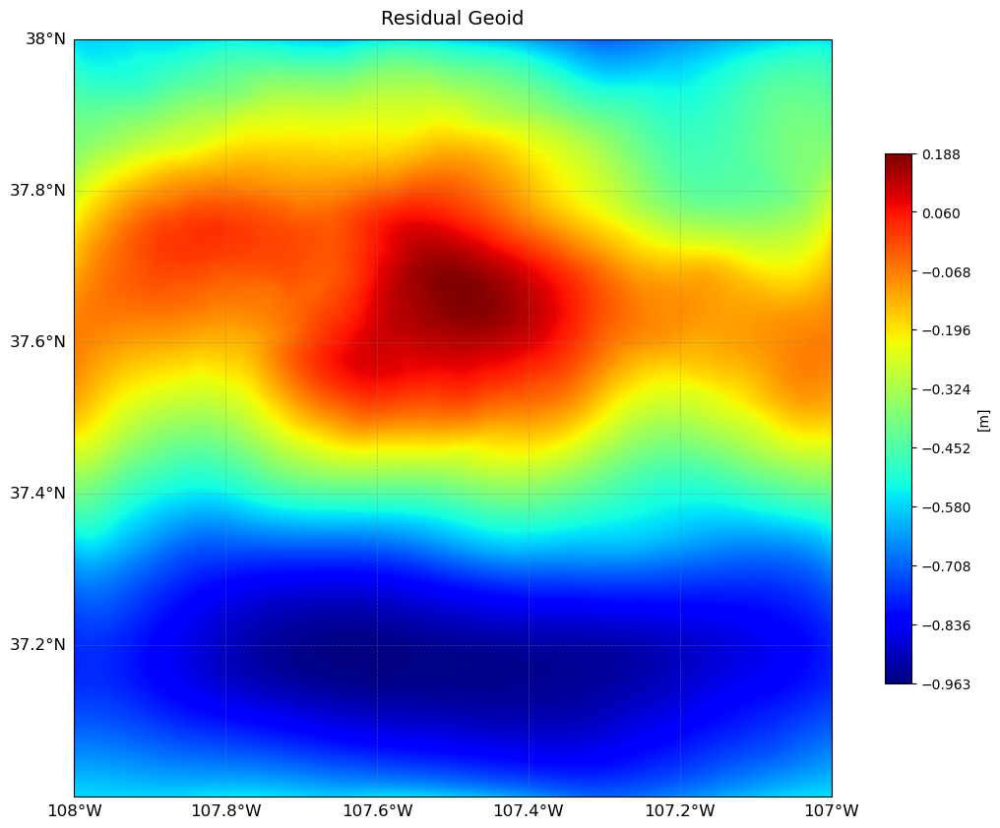

In [56]:
# Plot the gravity anomaly grid values
fig,ax = plot_2d_array_on_map(
    data_array=N_r, 
    lat_grid=lat_grid, 
    lon_grid=lon_grid, 
    title='Residual Geoid', 
    cmap='jet',
    unit_label= '[m]'
)

In [57]:
# Interpolate scattered GGM geoid data to grid
Geoid_GGM_grid = griddata((calculation_df['Longitude(DD)'], calculation_df['Latitude(DD)']),
                          calculation_df['Geoid_GGM(m)'], (lon_grid, lat_grid), method='linear')

In [58]:
co_geoid_grid = N_r + Geoid_GGM_grid

Plot saved to: GGM05G_Geoid_map_20250723_234636.jpeg


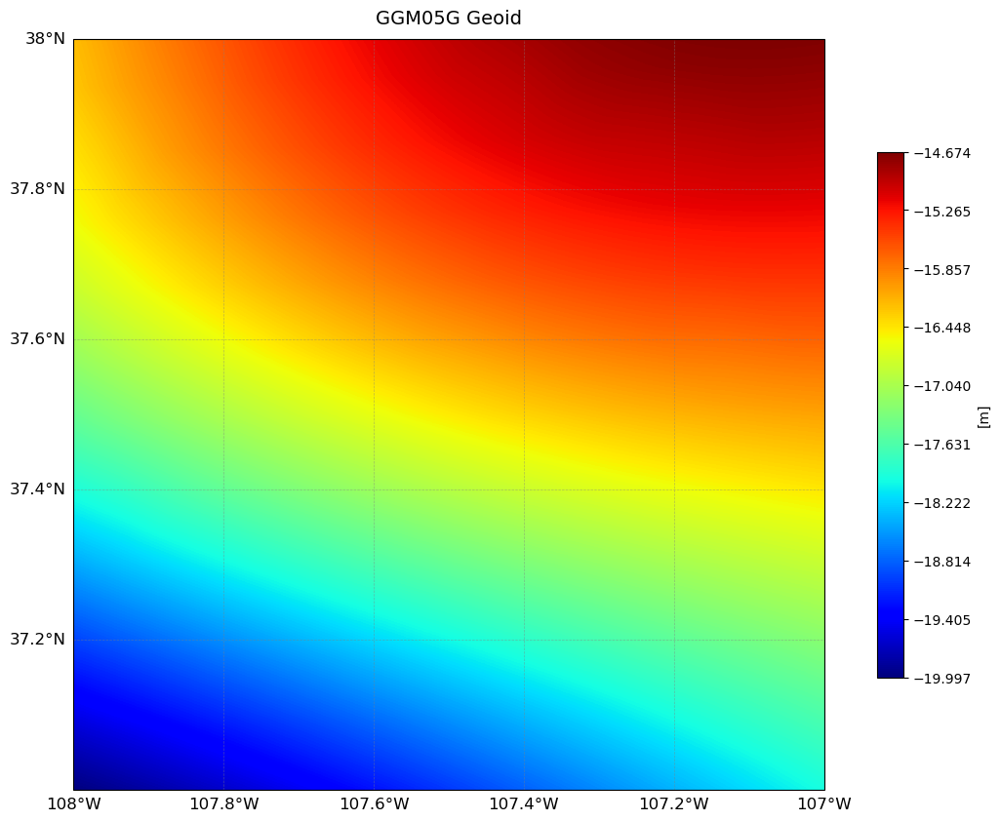

In [59]:
# Plot the gravity anomaly grid values
fig,ax = plot_2d_array_on_map(
    data_array=Geoid_GGM_grid, 
    lat_grid=lat_grid, 
    lon_grid=lon_grid, 
    title='GGM05G Geoid', 
    cmap='jet',
    unit_label= '[m]'
)

Plot saved to: Co-Geoid_map_20250723_234711.jpeg


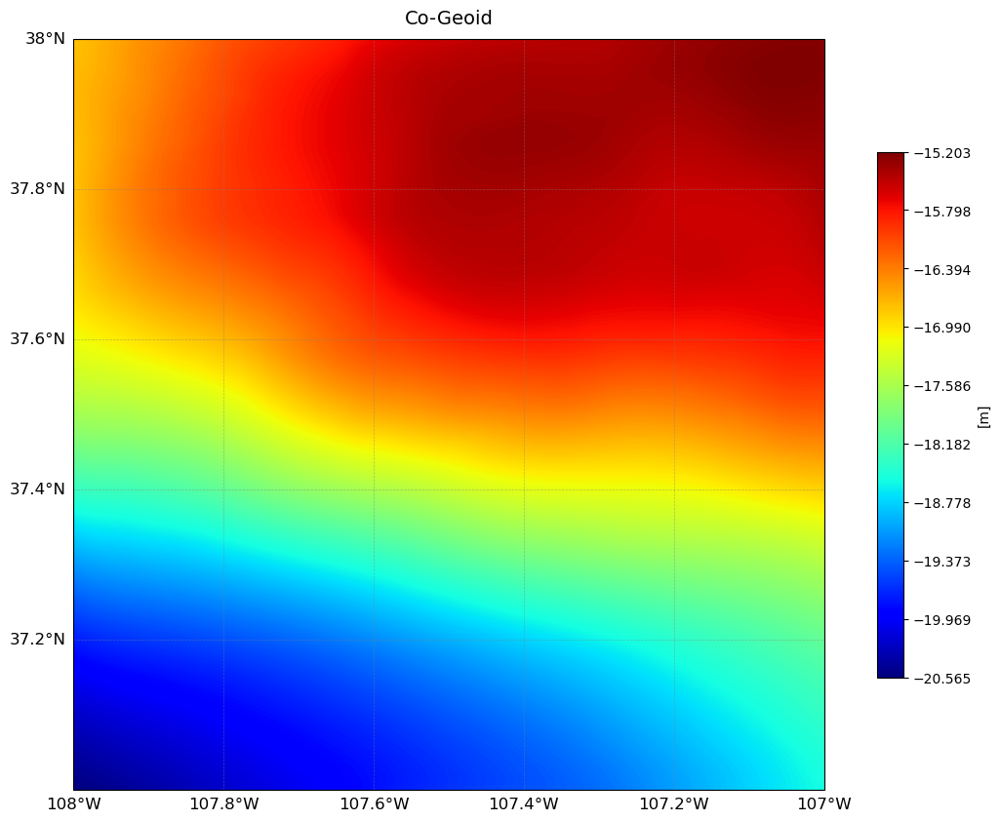

In [60]:
# Plot the gravity anomaly grid values
fig,ax = plot_2d_array_on_map(
    data_array=co_geoid_grid, 
    lat_grid=lat_grid, 
    lon_grid=lon_grid, 
    title='Co-Geoid', 
    cmap='jet',
    unit_label= '[m]'
)

In [61]:
geoid_difference = co_geoid_grid - Geoid_GGM_grid

mean_diff = np.nanmean(geoid_difference)
std_diff = np.nanstd(geoid_difference)
min_diff = np.nanmin(geoid_difference)
max_diff = np.nanmax(geoid_difference)

print(f"Mean geoid difference: {mean_diff:.4f} m")
print(f"Standard deviation: {std_diff:.4f} m")
print(f"Minimum difference: {min_diff:.4f} m")
print(f"Maximum difference: {max_diff:.4f} m")


Mean geoid difference: -0.4325 m
Standard deviation: 0.3189 m
Minimum difference: -0.9635 m
Maximum difference: 0.1879 m


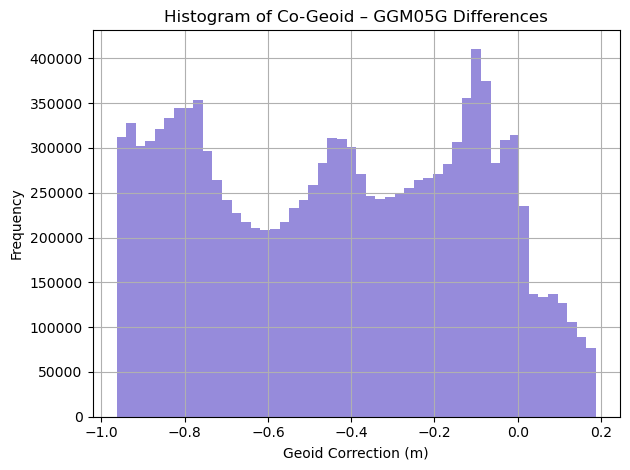

In [62]:
plt.hist(geoid_difference.flatten(), bins=50, color='slateblue', alpha=0.7)
plt.title('Histogram of Co-Geoid – GGM05G Differences')
plt.xlabel('Geoid Correction (m)')
plt.ylabel('Frequency')
plt.grid(True)
plt.tight_layout()
plt.savefig('geoid_difference_histogram.png', dpi=300)  # Save the figure
plt.show()


In [63]:
gy_ggm, gx_ggm = np.gradient(Geoid_GGM_grid)
gy_co, gx_co = np.gradient(co_geoid_grid)

rms_grad_ggm = np.sqrt(np.mean(gx_ggm**2 + gy_ggm**2))
rms_grad_co = np.sqrt(np.mean(gx_co**2 + gy_co**2))

print(f"RMS Gradient - GGM05G: {rms_grad_ggm:.4f}")
print(f"RMS Gradient - Co-Geoid: {rms_grad_co:.4f}")


RMS Gradient - GGM05G: 0.0012
RMS Gradient - Co-Geoid: 0.0015


In [64]:
import pandas as pd

def load_gsvs17_colorado(filepath=None):
    """
    Load GSVS17 (Colorado, 2017) Geoid Slope Validation Survey data.

    This survey evaluates geoid accuracy in a rugged, high elevation, gravimetrically 
    and topographically complex region.

    Parameters:
    -----------
    filepath : str, optional
        Path to the GSVS17 Excel file. If not provided, user will be prompted to input it.

    Returns:
    --------
    pd.DataFrame
        DataFrame containing Latitude, Longitude, Ellipsoid Height, Orthometric Height, and Geometric Geoid.
    """
    if filepath is None:
        filepath = input("Enter file path for GSVS17 (Colorado) Excel file: ")

    df = pd.read_excel(filepath, usecols="J:M")
    df.columns = ['Latitude', 'Longitude', 'Ellipsoid_Height', 'Orthometric_Height']
    df['Longitude'] = df['Longitude'].apply(lambda x: x - 360 if x > 180 else x)
    df['Geometric_Geoid'] = df['Ellipsoid_Height'] - df['Orthometric_Height']
    return df

In [66]:


gsvs_df = load_gsvs17_colorado()

Enter file path for GSVS17 (Colorado) Excel file:  C:\Users\SREEKANTH\Documents\Geoid_Modelling_V5\DATA\COLORADO\GSVS\GSVS17_FieldData.xlsx


In [67]:
gsvs_df

,Latitude,Longitude,Ellipsoid_Height,Orthometric_Height,Geometric_Geoid
0,37.222719,-107.857038,1944.077953,1964.21289,-20.134937
1,37.225326,-107.843995,1982.731310,2002.85979,-20.128480
2,37.228799,-107.831155,2026.360687,2046.46871,-20.108023
3,37.227313,-107.813812,2063.199316,2083.31371,-20.114394
4,37.229405,-107.796826,2108.607964,2128.72942,-20.121456
...,...,...,...,...,...
217,37.598185,-104.852805,1962.575633,1981.30525,-18.729617
218,37.600239,-104.834976,1939.559320,1958.36247,-18.803150
219,37.608471,-104.817230,1903.020957,1921.90404,-18.883083
220,37.616564,-104.797692,1874.828106,1893.79278,-18.964674


In [68]:
from scipy.interpolate import RegularGridInterpolator

# Determine modelling region Grid Bounds
lat_min, lat_max = lat_grid.min(), lat_grid.max()
lon_min, lon_max = lon_grid.min(), lon_grid.max()

# Filter GSVS Points within Grid
within_bounds_mask = (
    (gsvs_df['Latitude'] >= lat_min) & (gsvs_df['Latitude'] <= lat_max) &
    (gsvs_df['Longitude'] >= lon_min) & (gsvs_df['Longitude'] <= lon_max)
)
gsvs_df_filtered = gsvs_df[within_bounds_mask].copy()

# Interpolate Gravimetric Geoid at Valid Points
interpolator = RegularGridInterpolator(
    (lat_grid[:, 0], lon_grid[0, :]),
    co_geoid_grid,
    bounds_error=False,
    fill_value=np.nan
)

points = gsvs_df_filtered[['Latitude', 'Longitude']].to_numpy()
gsvs_df_filtered['Gravimetric_Co-Geoid'] = interpolator(points)

# Calculate Residuals
gsvs_df_filtered['Residual'] = gsvs_df_filtered['Geometric_Geoid'] - gsvs_df_filtered['Gravimetric_Co-Geoid']

In [69]:
# Compute Accuracy Statistics
rmse = np.sqrt(np.nanmean(gsvs_df_filtered['Residual']**2))
mean_error = np.nanmean(gsvs_df_filtered['Residual'])
std_dev = np.nanstd(gsvs_df_filtered['Residual'])

print("Co-Geoid Validation Results (Points within Grid Extent):")
print(f"→ RMSE: {rmse:.3f} meters")
print(f"→ Mean Error: {mean_error:.3f} meters")
print(f"→ Std. Deviation: {std_dev:.3f} meters")
print(f"→ Points used: {len(gsvs_df_filtered)} / {len(gsvs_df)}")

Co-Geoid Validation Results (Points within Grid Extent):
→ RMSE: 0.781 meters
→ Mean Error: -0.777 meters
→ Std. Deviation: 0.075 meters
→ Points used: 58 / 222


In [70]:
from scipy.interpolate import RegularGridInterpolator

# Determine modelling region Grid Bounds
lat_min, lat_max = lat_grid.min(), lat_grid.max()
lon_min, lon_max = lon_grid.min(), lon_grid.max()

# Filter GSVS Points within Grid
within_bounds_mask = (
    (gsvs_df['Latitude'] >= lat_min) & (gsvs_df['Latitude'] <= lat_max) &
    (gsvs_df['Longitude'] >= lon_min) & (gsvs_df['Longitude'] <= lon_max)
)
gsvs_df_filtered = gsvs_df[within_bounds_mask].copy()

# Interpolate Gravimetric Geoid at Valid Points
interpolator = RegularGridInterpolator(
    (lat_grid[:, 0], lon_grid[0, :]),
    Geoid_GGM_grid,
    bounds_error=False,
    fill_value=np.nan
)

points = gsvs_df_filtered[['Latitude', 'Longitude']].to_numpy()
gsvs_df_filtered['GGM_Geoid'] = interpolator(points)

# Calculate Residuals
gsvs_df_filtered['Residual'] = gsvs_df_filtered['Geometric_Geoid'] - gsvs_df_filtered['GGM_Geoid']

In [71]:
# Compute Accuracy Statistics
rmse = np.sqrt(np.nanmean(gsvs_df_filtered['Residual']**2))
mean_error = np.nanmean(gsvs_df_filtered['Residual'])
std_dev = np.nanstd(gsvs_df_filtered['Residual'])

print("GGM Geoid Validation Results (Points within Grid Extent):")
print(f"→ RMSE: {rmse:.3f} meters")
print(f"→ Mean Error: {mean_error:.3f} meters")
print(f"→ Std. Deviation: {std_dev:.3f} meters")
print(f"→ Points used: {len(gsvs_df_filtered)} / {len(gsvs_df)}")

GGM Geoid Validation Results (Points within Grid Extent):
→ RMSE: 1.643 meters
→ Mean Error: -1.638 meters
→ Std. Deviation: 0.125 meters
→ Points used: 58 / 222


In [72]:
import numpy as np
from scipy.signal import fftconvolve

def compute_indirect_effect_tiled(dem_array, g_normal_grid, tile_size=1024, pad=100,
                                   dx=30, dy=30, rho=2670, G=6.67430e-11):
    """
    Compute the indirect effect for geoid modeling using a tiled FFT-based convolution approach.

    Parameters:
    -----------
    dem_array : 2D numpy.ndarray
        Digital Elevation Model (DEM) in meters.
    g_normal_grid : 2D numpy.ndarray
        Normal gravity grid (in m/s²) for normalization.
    tile_size : int
        Size of processing tiles (e.g., 1024).
    pad : int
        Padding added to each tile to minimize edge effects.
    dx, dy : float
        Grid spacing in meters.
    rho : float
        Density in kg/m³. Default 2670.
    G : float
        Gravitational constant in m³/kg/s². Default 6.67430e-11.

    Returns:
    --------
    full_indirect : 2D numpy.ndarray
        Indirect effect in meters.
    """
    ny, nx = dem_array.shape
    full_indirect = np.zeros_like(dem_array, dtype=np.float64)

    def compute_tile(h_q_tile, g_tile):
        ty, tx = h_q_tile.shape
        x = np.arange(-tx // 2, tx // 2) * dx
        y = np.arange(-ty // 2, ty // 2) * dy
        X, Y = np.meshgrid(x, y)

        r = np.sqrt(X**2 + Y**2)
        r[r == 0] = np.inf
        K = (1 / r**3) * dx * dy

        Term1 = fftconvolve(h_q_tile**3, K, mode='same')
        Term2 = fftconvolve(np.ones_like(h_q_tile), K, mode='same')

        N_indirect = (-G * rho) * (np.pi * h_q_tile**2 + (1 / 6) * (Term1 - h_q_tile**3 * Term2))
        N_indirect /= g_tile
        return N_indirect

    for y_start in range(0, ny, tile_size):
        for x_start in range(0, nx, tile_size):
            y_end = min(y_start + tile_size, ny)
            x_end = min(x_start + tile_size, nx)

            # Padded region
            yp_start = max(y_start - pad, 0)
            yp_end = min(y_end + pad, ny)
            xp_start = max(x_start - pad, 0)
            xp_end = min(x_end + pad, nx)

            h_tile_padded = dem_array[yp_start:yp_end, xp_start:xp_end]
            g_tile_padded = g_normal_grid[yp_start:yp_end, xp_start:xp_end]

            n_tile = compute_tile(h_tile_padded, g_tile_padded)

            # Extract central tile from padded output
            y0 = y_start - yp_start
            y1 = y0 + (y_end - y_start)
            x0 = x_start - xp_start
            x1 = x0 + (x_end - x_start)

            full_indirect[y_start:y_end, x_start:x_end] = n_tile[y0:y1, x0:x1]

    return full_indirect
    
N_indirect = compute_indirect_effect_tiled(dem_array, g_normal_grid, tile_size=1024, pad=100)

Plot saved to: Indirect_Effect_map_20250723_234945.jpeg


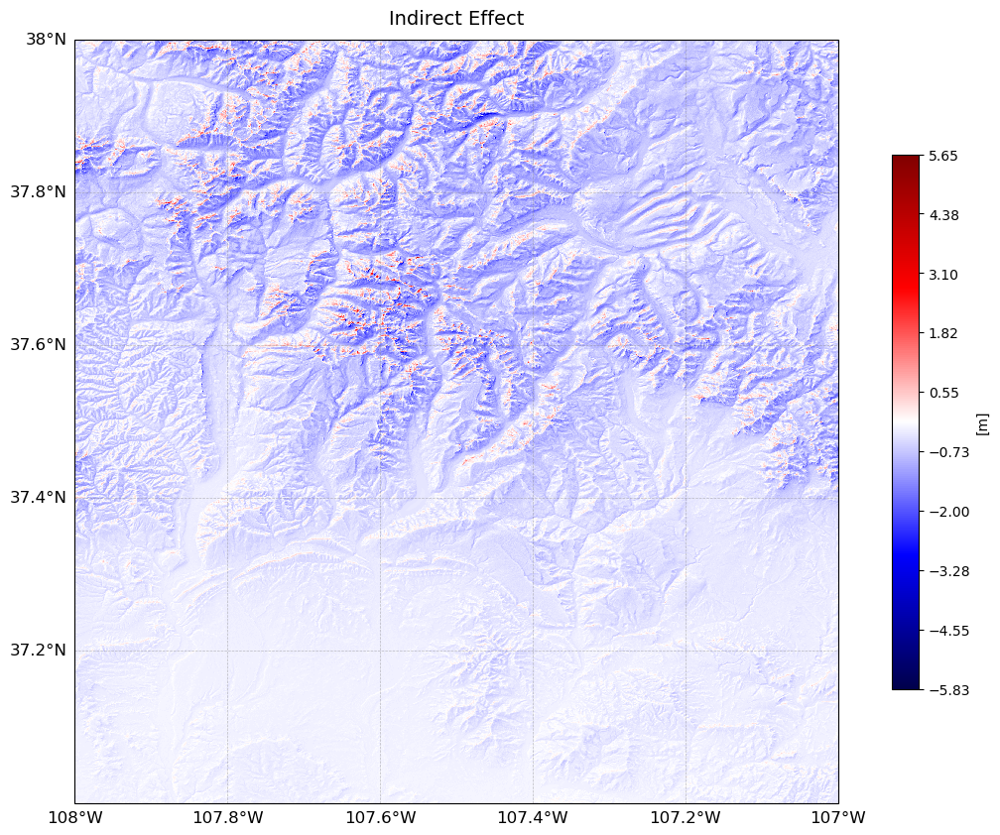

In [73]:
# Plot the gravity anomaly grid values
fig,ax = plot_2d_array_on_map(
    data_array=N_indirect, 
    lat_grid=lat_grid, 
    lon_grid=lon_grid, 
    title='Indirect Effect', 
    cmap='seismic',
    unit_label= '[m]'
)

In [74]:
import nbimporter
import utils_notebook

from utils_notebook import compute_indirect_effect_fft

N_indirect = compute_indirect_effect_fft(dem_array, g_normal_grid)

In [75]:
# Apply 3-sigma clipping to remove harsh outliers primaly due to edge effect of FFT

# Compute mean and standard deviation of the entire 2D array
mean_N = np.mean(N_indirect)
std_N = np.std(N_indirect)

# Compute the 3-sigma confidence interval
CI_N = mean_N + 3 * std_N  # Upper threshold
CN_N = mean_N - 3 * std_N  # Lower threshold

# Create a copy of N_indirect_m to store the modified values
N_indirect_filtered = np.copy(N_indirect)
# Replace outliers with the mean in the new variable
N_indirect_filtered[(N_indirect_filtered > CI_N) | (N_indirect_filtered < CN_N)] = mean_N

In [76]:
final_geoid_grid = co_geoid_grid + N_indirect_filtered

Plot saved to: Indirect_Effect_map_20250723_235037.jpeg


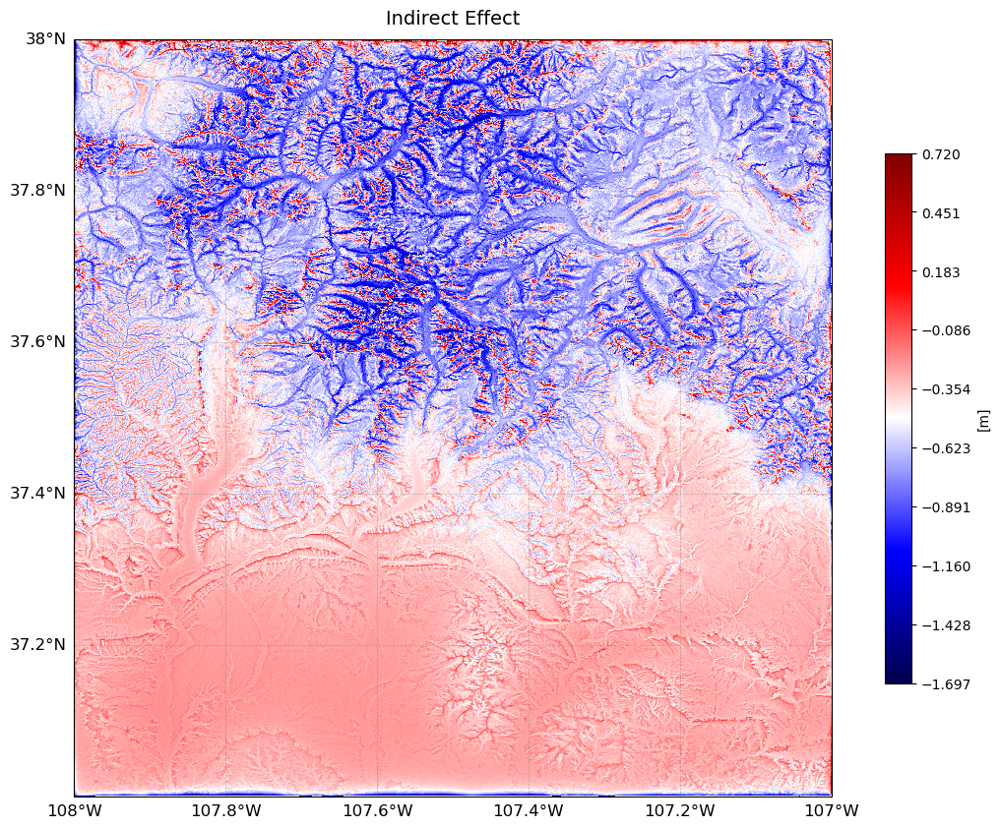

In [77]:
# Plot the gravity anomaly grid values
fig,ax = plot_2d_array_on_map(
    data_array=N_indirect_filtered, 
    lat_grid=lat_grid, 
    lon_grid=lon_grid, 
    title='Indirect Effect', 
    cmap='seismic',
    unit_label= '[m]'
)

Plot saved to: Regional_Geoid_map_20250723_235113.jpeg


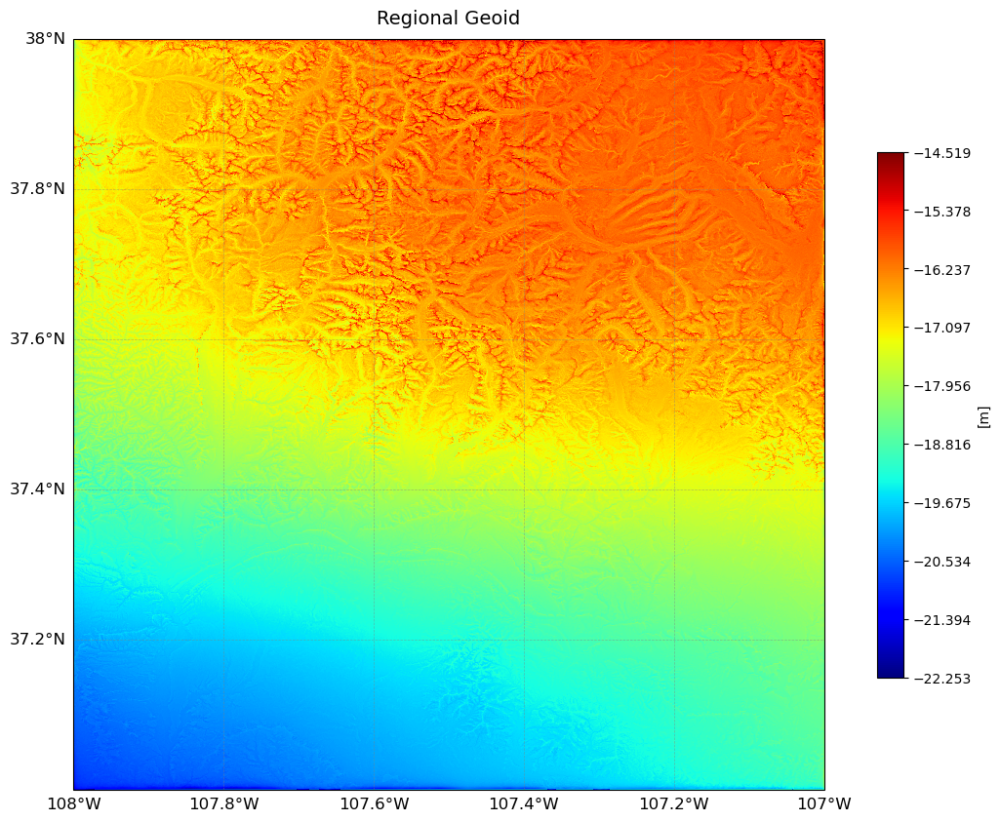

In [78]:
# Plot the gravity anomaly grid values
fig,ax = plot_2d_array_on_map(
    data_array=final_geoid_grid, 
    lat_grid=lat_grid, 
    lon_grid=lon_grid, 
    title='Regional Geoid', 
    cmap='jet',
    unit_label= '[m]'
)

In [79]:
from scipy.interpolate import RegularGridInterpolator

# Determine modelling region Grid Bounds
lat_min, lat_max = lat_grid.min(), lat_grid.max()
lon_min, lon_max = lon_grid.min(), lon_grid.max()

# Filter GSVS Points within Grid
within_bounds_mask = (
    (gsvs_df['Latitude'] >= lat_min) & (gsvs_df['Latitude'] <= lat_max) &
    (gsvs_df['Longitude'] >= lon_min) & (gsvs_df['Longitude'] <= lon_max)
)
gsvs_df_filtered = gsvs_df[within_bounds_mask].copy()

# Interpolate Gravimetric Geoid at Valid Points
interpolator = RegularGridInterpolator(
    (lat_grid[:, 0], lon_grid[0, :]),
    final_geoid_grid,
    bounds_error=False,
    fill_value=np.nan
)

points = gsvs_df_filtered[['Latitude', 'Longitude']].to_numpy()
gsvs_df_filtered['Gravimetric_Final-Geoid'] = interpolator(points)

# Calculate Residuals
gsvs_df_filtered['Residual'] = gsvs_df_filtered['Geometric_Geoid'] - gsvs_df_filtered['Gravimetric_Final-Geoid']

In [80]:
# Compute Accuracy Statistics
rmse = np.sqrt(np.nanmean(gsvs_df_filtered['Residual']**2))
mean_error = np.nanmean(gsvs_df_filtered['Residual'])
std_dev = np.nanstd(gsvs_df_filtered['Residual'])

print("Final-Geoid Validation Results (Points within Grid Extent):")
print(f"→ RMSE: {rmse:.3f} meters")
print(f"→ Mean Error: {mean_error:.3f} meters")
print(f"→ Std. Deviation: {std_dev:.3f} meters")
print(f"→ Points used: {len(gsvs_df_filtered)} / {len(gsvs_df)}")

Final-Geoid Validation Results (Points within Grid Extent):
→ RMSE: 0.470 meters
→ Mean Error: -0.461 meters
→ Std. Deviation: 0.094 meters
→ Points used: 58 / 222


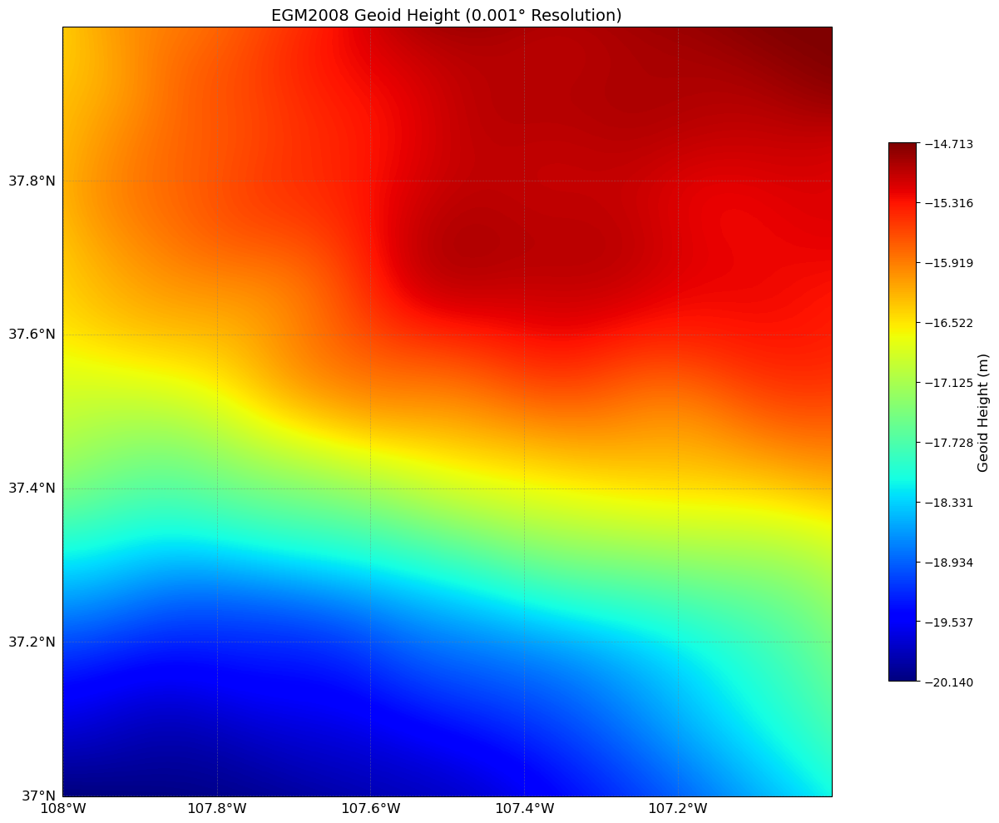

In [81]:
import rasterio
import numpy as np
import matplotlib.pyplot as plt
import cartopy.crs as ccrs
from cartopy.mpl.gridliner import LONGITUDE_FORMATTER, LATITUDE_FORMATTER
from matplotlib.ticker import MultipleLocator

# Path to the EGM2008 GeoTIFF
egm_tif_path = r"C:\Users\SREEKANTH\Documents\Geoid_Modelling_V5\DATA\COLORADO\geoid_EGM2008.tiff"

# Load the GeoTIFF
with rasterio.open(egm_tif_path) as src:
    egm_geoid_grid = src.read(1)
    transform = src.transform
    width = src.width
    height = src.height

    egm_lon = np.arange(width) * transform.a + transform.c
    egm_lat = np.arange(height) * transform.e + transform.f

# Flip latitude if needed
if egm_lat[0] < egm_lat[-1]:
    egm_lat = egm_lat[::-1]
    egm_geoid_grid = np.flipud(egm_geoid_grid)

# Create meshgrid
egm_lon_grid, egm_lat_grid = np.meshgrid(egm_lon, egm_lat)

# Convert longitudes > 180 to WGS84
egm_lon_grid_wgs84 = np.where(egm_lon_grid > 180, egm_lon_grid - 360, egm_lon_grid)

# Define color scale
vmin = np.nanmin(egm_geoid_grid)
vmax = np.nanmax(egm_geoid_grid)
ticks = np.linspace(vmin, vmax, 10)

# Plot
fig = plt.figure(figsize=(14, 10))
ax = plt.axes(projection=ccrs.PlateCarree())

# Pcolormesh for geoid
geoid_plot = ax.pcolormesh(
    egm_lon_grid_wgs84,
    egm_lat_grid,
    egm_geoid_grid,
    shading='auto',
    cmap='jet',
    vmin=vmin,
    vmax=vmax,
    transform=ccrs.PlateCarree()
)

# Gridlines
gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 12}
gl.ylabel_style = {'size': 12}
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER
gl.xlocator = MultipleLocator(0.2)
gl.ylocator = MultipleLocator(0.2)

# Colorbar
cbar = plt.colorbar(geoid_plot, ax=ax, orientation='vertical', shrink=0.7)
cbar.set_label('Geoid Height (m)', fontsize=12)
cbar.set_ticks(ticks)

# Title
plt.title('EGM2008 Geoid Height (0.001° Resolution)', fontsize=14)

plt.tight_layout()
plt.show()


In [82]:
from scipy.interpolate import griddata
from sklearn.metrics import mean_squared_error
import numpy as np

# --- Flatten the EGM grid for interpolation ---
egm_points = np.column_stack((egm_lon_grid_wgs84.ravel(), egm_lat_grid.ravel()))
egm_values = egm_geoid_grid.ravel()

# --- Target points (final geoid grid) ---
target_points = np.column_stack((lon_grid.ravel(), lat_grid.ravel()))

In [83]:

# --- Interpolate EGM geoid to final geoid grid resolution ---
interpolated_egm_geoid = griddata(
    egm_points, egm_values, target_points, method='linear'
).reshape(final_geoid_grid.shape)

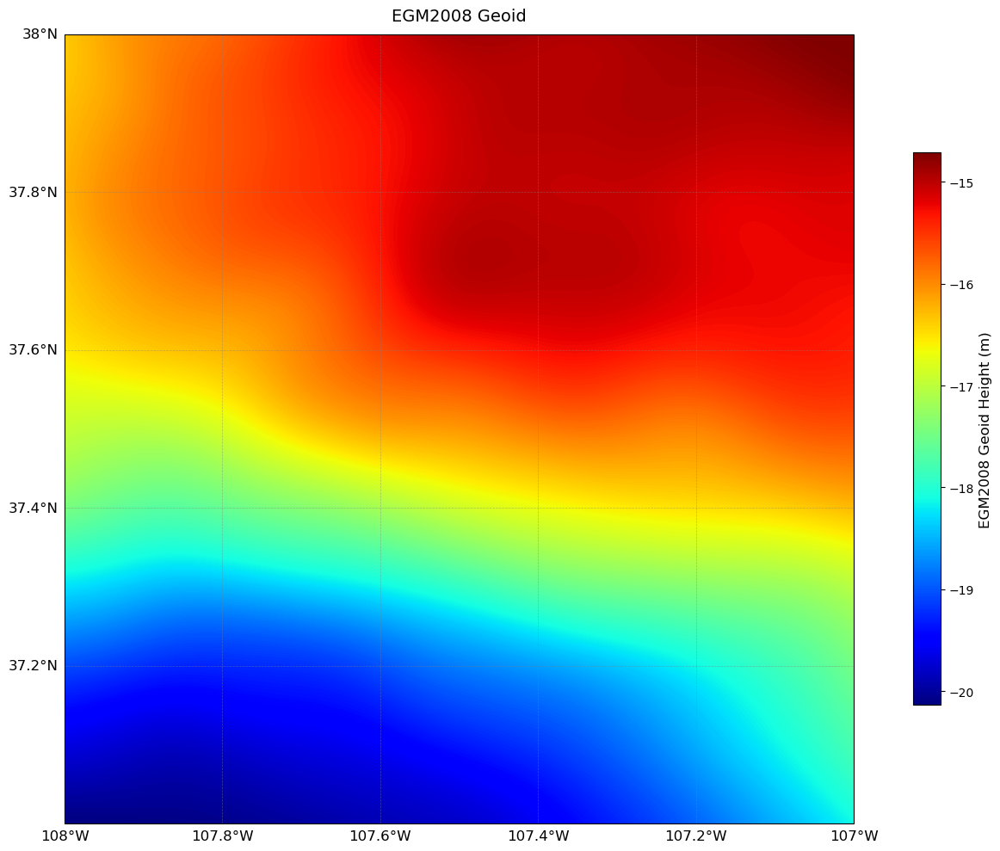

In [84]:
# --- Plot interpolated EGM geoid on final grid using Cartopy ---
fig = plt.figure(figsize=(14, 10))
ax = plt.axes(projection=ccrs.PlateCarree())

vmin = np.nanmin(interpolated_egm_geoid)
vmax = np.nanmax(interpolated_egm_geoid)

p = ax.pcolormesh(
    lon_grid,
    lat_grid,
    interpolated_egm_geoid,
    shading='auto',
    cmap='jet',
    vmin=vmin,
    vmax=vmax,
    transform=ccrs.PlateCarree()
)

# Gridlines
gl = ax.gridlines(draw_labels=True, linewidth=0.5, color='gray', alpha=0.5, linestyle='--')
gl.top_labels = False
gl.right_labels = False
gl.xlabel_style = {'size': 12}
gl.ylabel_style = {'size': 12}
gl.xformatter = LONGITUDE_FORMATTER
gl.yformatter = LATITUDE_FORMATTER
gl.xlocator = MultipleLocator(0.2)
gl.ylocator = MultipleLocator(0.2)

# Colorbar
cbar = plt.colorbar(p, ax=ax, orientation='vertical', shrink=0.7)
cbar.set_label('EGM2008 Geoid Height (m)', fontsize=12)

# Title
plt.title('EGM2008 Geoid', fontsize=14)

plt.tight_layout()
plt.show()

In [85]:
# Count NaNs
nan_count_egm = np.isnan(interpolated_egm_geoid).sum()
nan_count_final = np.isnan(final_geoid_grid).sum()

# Print
print(f"NaN values in Interpolated EGM Grid: {nan_count_egm}")
print(f"NaN values in Final Geoid Grid     : {nan_count_final}")

NaN values in Interpolated EGM Grid: 14400
NaN values in Final Geoid Grid     : 0


In [86]:

# --- Mask invalid values ---
mask = ~np.isnan(interpolated_egm_geoid) & ~np.isnan(final_geoid_grid)

In [87]:



# --- Compute accuracy metrics ---
if np.any(mask):
    differences = final_geoid_grid[mask] - interpolated_egm_geoid[mask]
    rmse = np.sqrt(mean_squared_error(interpolated_egm_geoid[mask], final_geoid_grid[mask]))
    mean_error = np.mean(differences)
    std_dev = np.std(differences)
    points_used = np.count_nonzero(mask)

    print("✅ Regional Geoid vs EGM2008 Comparison (EGM interpolated to final grid):")
    print(f"→ RMSE         : {rmse:.3f} m")
    print(f"→ Mean Error   : {mean_error:.3f} m")
    print(f"→ Std. Deviation: {std_dev:.3f} m")
    print(f"→ Points used  : {points_used}")
else:
    print("⚠️ No valid overlapping points found. Check grid alignment and coverage.")


✅ Regional Geoid vs EGM2008 Comparison (EGM interpolated to final grid):
→ RMSE         : 0.941 m
→ Mean Error   : -0.887 m
→ Std. Deviation: 0.316 m
→ Points used  : 12952801


In [88]:
from scipy.interpolate import RegularGridInterpolator

# Determine modelling region Grid Bounds
lat_min, lat_max = lat_grid.min(), lat_grid.max()
lon_min, lon_max = lon_grid.min(), lon_grid.max()

# Filter GSVS Points within Grid
within_bounds_mask = (
    (gsvs_df['Latitude'] >= lat_min) & (gsvs_df['Latitude'] <= lat_max) &
    (gsvs_df['Longitude'] >= lon_min) & (gsvs_df['Longitude'] <= lon_max)
)
gsvs_df_filtered = gsvs_df[within_bounds_mask].copy()

# Interpolate Gravimetric Geoid at Valid Points
interpolator = RegularGridInterpolator(
    (lat_grid[:, 0], lon_grid[0, :]),
    interpolated_egm_geoid,
    bounds_error=False,
    fill_value=np.nan
)

points = gsvs_df_filtered[['Latitude', 'Longitude']].to_numpy()
gsvs_df_filtered['EGM-Geoid'] = interpolator(points)

# Calculate Residuals
gsvs_df_filtered['Residual'] = gsvs_df_filtered['Geometric_Geoid'] - gsvs_df_filtered['EGM-Geoid']

In [89]:
# Compute Accuracy Statistics
rmse = np.sqrt(np.nanmean(gsvs_df_filtered['Residual']**2))
mean_error = np.nanmean(gsvs_df_filtered['Residual'])
std_dev = np.nanstd(gsvs_df_filtered['Residual'])

print("EGM Geoid Validation Results (Points within Grid Extent):")
print(f"→ RMSE: {rmse:.3f} meters")
print(f"→ Mean Error: {mean_error:.3f} meters")
print(f"→ Std. Deviation: {std_dev:.3f} meters")
print(f"→ Points used: {len(gsvs_df_filtered)} / {len(gsvs_df)}")

EGM Geoid Validation Results (Points within Grid Extent):
→ RMSE: 1.045 meters
→ Mean Error: -1.045 meters
→ Std. Deviation: 0.022 meters
→ Points used: 58 / 222


Plot saved to: EGM-2008_Geoid_map_20250723_235248.jpeg


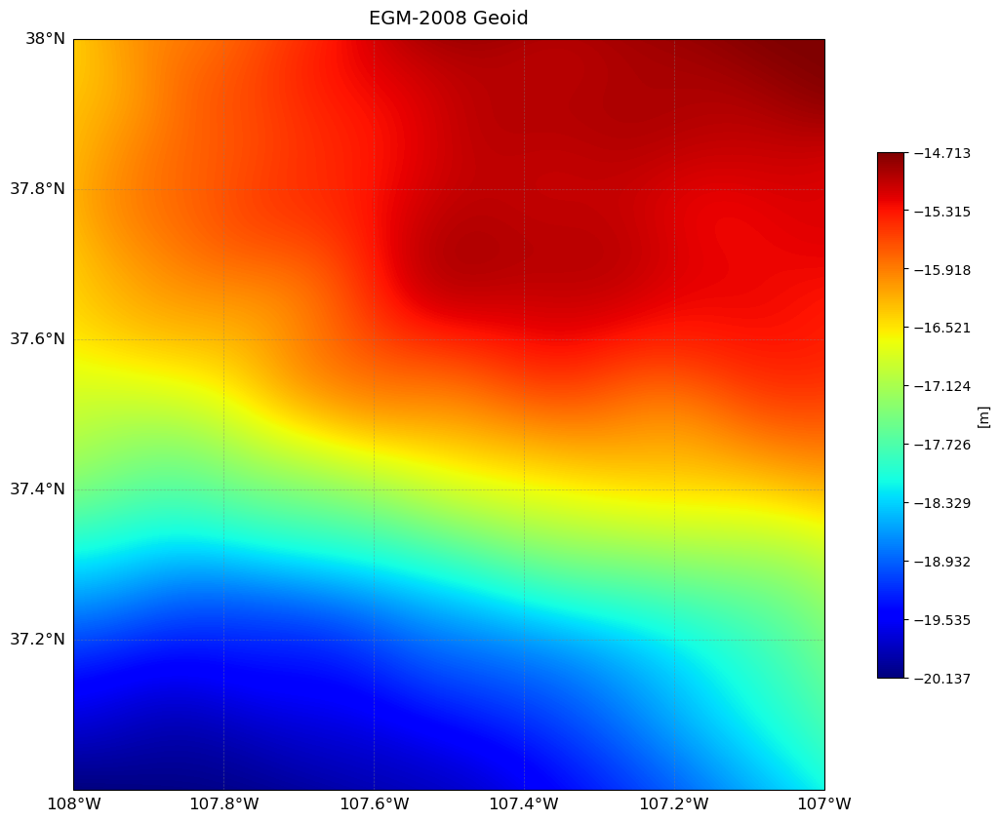

In [90]:
# Plot the gravity anomaly grid values
fig,ax = plot_2d_array_on_map(
    data_array=interpolated_egm_geoid, 
    lat_grid=lat_grid, 
    lon_grid=lon_grid, 
    title='EGM-2008 Geoid', 
    cmap='jet',
    unit_label= '[m]'
)